# BTK Datathon 2024

## Install Python Packages

In [1]:
# %pip install numpy pandas tqdm matplotlib seaborn rapidfuzz scikit-learn catboost

In [2]:
import numpy as np
import pandas as pd
from tqdm import tqdm
import seaborn as sns
import warnings
import re
from datetime import datetime
from rapidfuzz import process,fuzz
from collections import defaultdict
from dateutil import parser

## Exploratory Data Analysis

In [3]:
# Show all columns
pd.set_option('display.max_columns', None)

### Load CSV files and have a look at the train file

In [4]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test_x.csv')
train_df.head()

C:\Users\Utku\AppData\Local\Temp\ipykernel_5232\942173286.py:1: DtypeWarning: Columns (13,15,19,30,32,37,41,42) have mixed types. Specify dtype option on import or set low_memory=False.
  train_df = pd.read_csv('train.csv')


,Basvuru Yili,Degerlendirme Puani,Cinsiyet,Dogum Tarihi,Dogum Yeri,Ikametgah Sehri,Universite Adi,Universite Turu,Burslu ise Burs Yuzdesi,Burs Aliyor mu?,Bölüm,Universite Kacinci Sinif,Universite Not Ortalamasi,Daha Once Baska Bir Universiteden Mezun Olmus,Lise Adi,Lise Adi Diger,Lise Sehir,Lise Turu,Lise Bolumu,Lise Bolum Diger,Lise Mezuniyet Notu,Baska Bir Kurumdan Burs Aliyor mu?,Burs Aldigi Baska Kurum,Baska Kurumdan Aldigi Burs Miktari,Anne Egitim Durumu,Anne Calisma Durumu,Anne Sektor,Baba Egitim Durumu,Baba Calisma Durumu,Baba Sektor,Kardes Sayisi,Girisimcilik Kulupleri Tarzi Bir Kulube Uye misiniz?,Uye Oldugunuz Kulubun Ismi,Profesyonel Bir Spor Daliyla Mesgul musunuz?,Spor Dalindaki Rolunuz Nedir?,Aktif olarak bir STK üyesi misiniz?,Hangi STK'nin Uyesisiniz?,Stk Projesine Katildiniz Mi?,Girisimcilikle Ilgili Deneyiminiz Var Mi?,Girisimcilikle Ilgili Deneyiminizi Aciklayabilir misiniz?,Ingilizce Biliyor musunuz?,Ingilizce Seviyeniz?,"Daha Önceden Mezun Olunduysa, Mezun Olunan Üniversite",id
0,2014,52.0,Erkek,4/6/1994,"Altindag, Ankara",Ankara,İHSAN DOĞRAMACI BİLKENT,Özel,100.0,Evet,Bilgisayar Muhendisligi,3,3.50-3,Hayır,Ankara Ataturk Anadolu Lisesi,NaN,Ankara,Anadolu lisesi,MF,NaN,3.50-3,Hayır,NaN,NaN,Üniversite,Hayır,0,Üniversite,Emekli,0,1,Evet,Bilkent IEEE Bilgisayar Toplulugu 2013-2014 Ba...,Evet,Diğer,Hayır,NaN,Evet,Hayır,NaN,NaN,NaN,NaN,0
1,2014,30.0,Erkek,6/11/1993,Üsküdar,İstanbul,İHSAN DOĞRAMACI BİLKENT,Özel,100.0,Hayır,Elektrik Elektronik Mühendisliği,3,3.00-2.50,Hayır,Betül Can Anadolu Lisesi,NaN,Ankara,Anadolu lisesi,MF,NaN,3.00 - 4.00,Hayır,NaN,NaN,Üniversite,Evet,Kamu,Yüksek Lisans / Doktora,Emekli,0,1,Hayır,NaN,Hayır,0,Hayır,NaN,Evet,Evet,Bilkent Cyberparkta bir şirkette Türkiye nin i...,NaN,NaN,NaN,1
2,2014,18.0,Erkek,1/15/1986,Samsun,İstanbul,ULUSLARARASI KIBRIS ÜNİVERSİTESİ,Özel,100.0,Hayır,Finans Yönetimi ve Pazarlama,1,NaN,Hayır,Batem,NaN,Ankara,Meslek lisesi,Elektirk,NaN,3.50-3,Hayır,NaN,NaN,İlkokul Mezunu,Hayır,0,İlkokul Mezunu,Evet,Özel Sektör,6,Evet,Tema,Hayır,0,Hayır,NaN,Hayır,Hayır,NaN,NaN,NaN,NaN,2
3,2014,40.0,Erkek,6/4/1991,Diyarbakır,İstanbul,İSTANBUL ŞEHİR ÜNİVERSİTESİ,Özel,100.0,Evet,Bilgisayar Mühendisliği,3,3.00-2.50,Hayır,Cumhuriyet Fen Lisesi,NaN,Diyarbakır,Fen lisesi,Sayısal,NaN,3.50-3,Hayır,NaN,NaN,İlkokul Mezunu,Hayır,0,Üniversite,Emekli,0,10,Evet,Güzel Konuşma ve yazma kulübü,Hayır,0,Hayır,NaN,Evet,Hayır,NaN,NaN,NaN,NaN,3
4,2014,24.0,Erkek,2 Kasim 1992,Ankara/Altındağ,Ankara,TURGUT ÖZAL ÜNİVERSİTESİ,Özel,100.0,Evet,Siyaset Bilimi ve Uluslararası ilişkiler,NaN,3.00-2.50,Hayır,Samanyolu Lisesi,NaN,Ankara,Özel lisesi,TM,NaN,3.00 - 4.00,Hayır,NaN,NaN,İlkokul Mezunu,Hayır,0,Üniversite,Emekli,0,1,Hayır,NaN,Hayır,0,Hayır,NaN,Hayır,Hayır,NaN,NaN,NaN,NaN,4


In [5]:
print(train_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65125 entries, 0 to 65124
Data columns (total 44 columns):
 #   Column                                                     Non-Null Count  Dtype  
---  ------                                                     --------------  -----  
 0   Basvuru Yili                                               65125 non-null  int64  
 1   Degerlendirme Puani                                        65124 non-null  float64
 2   Cinsiyet                                                   64956 non-null  object 
 3   Dogum Tarihi                                               64948 non-null  object 
 4   Dogum Yeri                                                 64334 non-null  object 
 5   Ikametgah Sehri                                            63088 non-null  object 
 6   Universite Adi                                             64993 non-null  object 
 7   Universite Turu                                            64870 non-null  object 
 8   Burslu

In [6]:
train_df.describe()

,Basvuru Yili,Degerlendirme Puani,Burslu ise Burs Yuzdesi,id
count,65125.000000,65124.000000,22440.000000,65125.000000
mean,2018.277298,32.086466,34.226181,32562.000000
std,2.669979,18.139239,41.632412,18800.112478
min,2014.000000,0.000000,0.000000,0.000000
25%,2016.000000,18.000000,0.000000,16281.000000
50%,2019.000000,29.000000,0.000000,32562.000000
75%,2021.000000,44.000000,75.000000,48843.000000
max,2022.000000,102.000000,100.000000,65124.000000


In [7]:
train_df.isnull().sum()

Basvuru Yili                                                     0
Degerlendirme Puani                                              1
Cinsiyet                                                       169
Dogum Tarihi                                                   177
Dogum Yeri                                                     791
Ikametgah Sehri                                               2037
Universite Adi                                                 132
Universite Turu                                                255
Burslu ise Burs Yuzdesi                                      42685
Burs Aliyor mu?                                                  0
Bölüm                                                          231
Universite Kacinci Sinif                                       374
Universite Not Ortalamasi                                     2753
Daha Once Baska Bir Universiteden Mezun Olmus                37345
Lise Adi                                                      

<Axes: xlabel='Basvuru Yili', ylabel='count'>

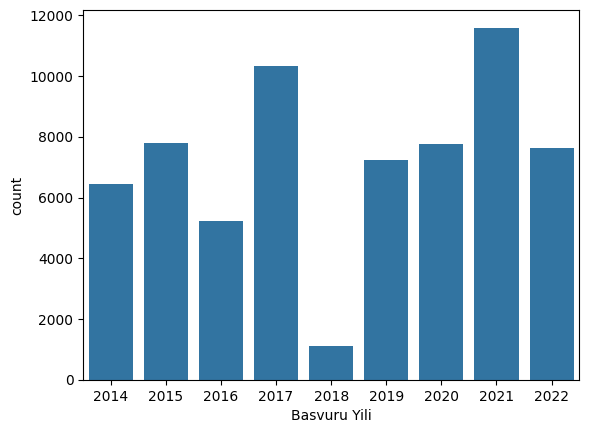

In [8]:
sns.countplot(x=train_df['Basvuru Yili'])

<Axes: xlabel='Degerlendirme Puani', ylabel='Density'>

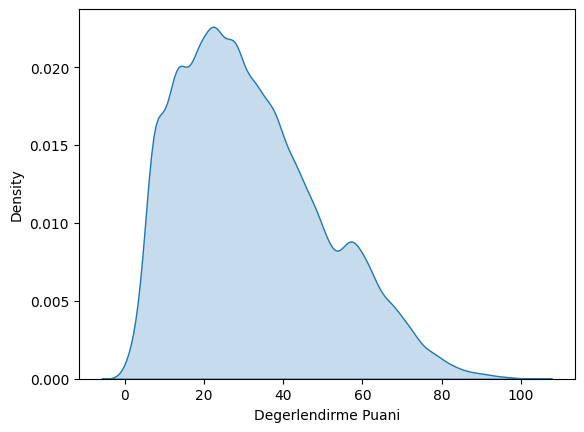

In [9]:
sns.kdeplot(train_df['Degerlendirme Puani'], fill=True)

<Axes: xlabel='Cinsiyet', ylabel='count'>

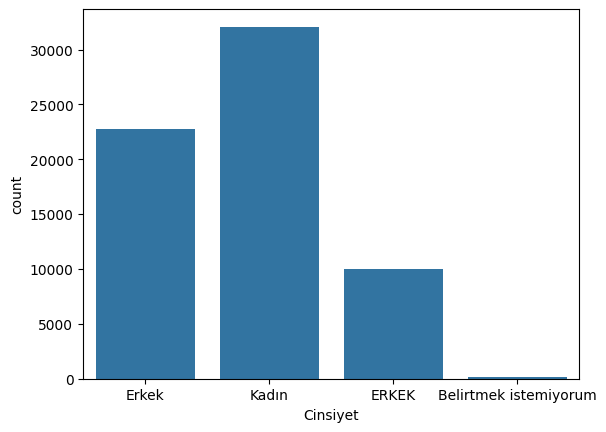

In [10]:
sns.countplot(x=train_df['Cinsiyet'])

<Axes: xlabel='Universite Turu', ylabel='count'>

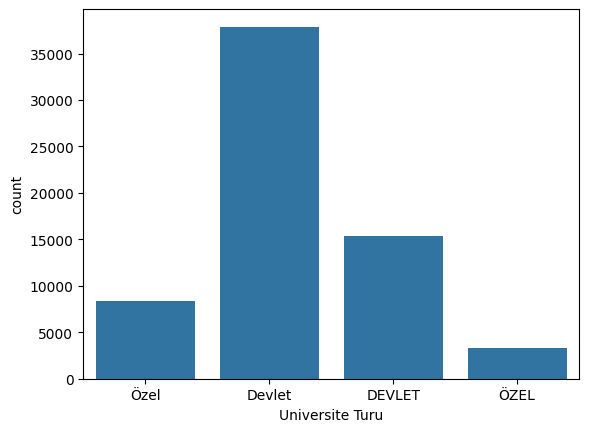

In [11]:
sns.countplot(x=train_df['Universite Turu'])

<Axes: xlabel='Burs Aliyor mu?', ylabel='count'>

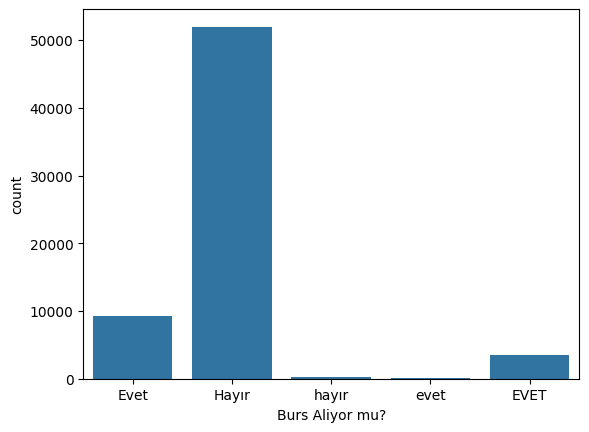

In [12]:
sns.countplot(x=train_df['Burs Aliyor mu?'])

<Axes: xlabel='Girisimcilik Kulupleri Tarzi Bir Kulube Uye misiniz?', ylabel='count'>

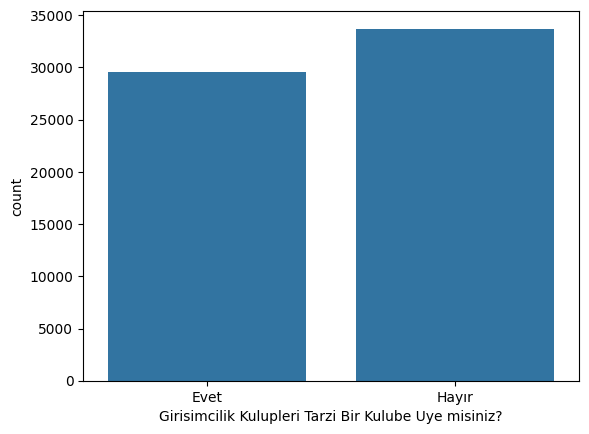

In [13]:
sns.countplot(x=train_df['Girisimcilik Kulupleri Tarzi Bir Kulube Uye misiniz?'])

<Axes: xlabel='Ingilizce Biliyor musunuz?', ylabel='count'>

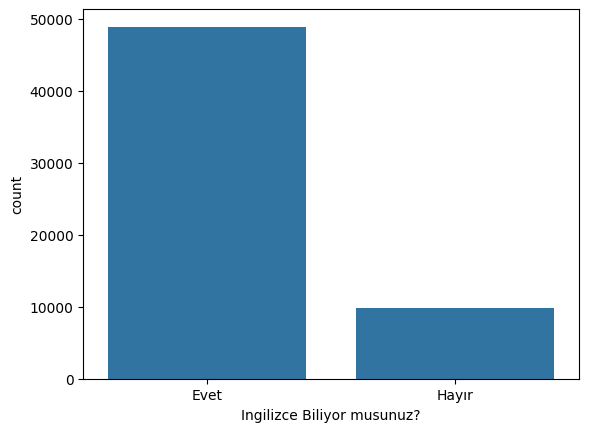

In [14]:
sns.countplot(x=train_df['Ingilizce Biliyor musunuz?'])

<Axes: xlabel='Ingilizce Seviyeniz?', ylabel='count'>

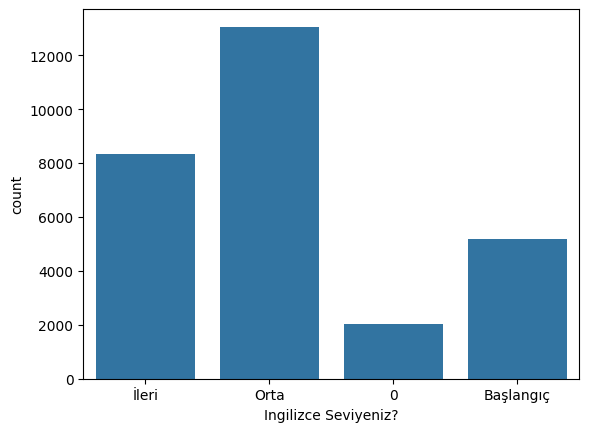

In [15]:
sns.countplot(x=train_df['Ingilizce Seviyeniz?'])

### Number of Unique Values per Column

In [16]:
# Check number of unique values
for column in train_df.columns:
    print(f'{column}: {len(train_df[column].unique())}')

Basvuru Yili: 9
Degerlendirme Puani: 98
Cinsiyet: 5
Dogum Tarihi: 13499
Dogum Yeri: 2231
Ikametgah Sehri: 320
Universite Adi: 528
Universite Turu: 5
Burslu ise Burs Yuzdesi: 52
Burs Aliyor mu?: 5
Bölüm: 7749
Universite Kacinci Sinif: 13
Universite Not Ortalamasi: 21
Daha Once Baska Bir Universiteden Mezun Olmus: 3
Lise Adi: 31951
Lise Adi Diger: 4011
Lise Sehir: 889
Lise Turu: 17
Lise Bolumu: 888
Lise Bolum Diger: 863
Lise Mezuniyet Notu: 20
Baska Bir Kurumdan Burs Aliyor mu?: 3
Burs Aldigi Baska Kurum: 3960
Baska Kurumdan Aldigi Burs Miktari: 588
Anne Egitim Durumu: 22
Anne Calisma Durumu: 4
Anne Sektor: 9
Baba Egitim Durumu: 23
Baba Calisma Durumu: 4
Baba Sektor: 9
Kardes Sayisi: 29
Girisimcilik Kulupleri Tarzi Bir Kulube Uye misiniz?: 3
Uye Oldugunuz Kulubun Ismi: 13424
Profesyonel Bir Spor Daliyla Mesgul musunuz?: 3
Spor Dalindaki Rolunuz Nedir?: 10
Aktif olarak bir STK üyesi misiniz?: 3
Hangi STK'nin Uyesisiniz?: 9491
Stk Projesine Katildiniz Mi?: 3
Girisimcilikle Ilgili Deneyimin

## Preprocessing

### Read University Scores from the external xlsx file

In [17]:
university_list = pd.read_excel('university_scores_2.xlsx')

university_list['Universite Adi'] = university_list['University Name']
university_list = university_list.drop('University Name', axis=1)

university_list['University Score'] = university_list['Unnamed: 1']
university_list = university_list.drop('Unnamed: 1', axis=1)
university_list.head()

,Universite Adi,University Score
0,İHSAN DOĞRAMACI BİLKENT,485.868
1,ULUSLARARASI KIBRIS ÜNİVERSİTESİ,346.513
2,İSTANBUL ŞEHİR ÜNİVERSİTESİ,434.749
3,TURGUT ÖZAL ÜNİVERSİTESİ,352.46
4,İSTANBUL TİCARET ÜNİVERSİTESİ,387.294


### Apply left join on both train and test datasets, with university scores table

In [18]:
train_df = pd.merge(train_df, university_list, how="left", on='Universite Adi')
train_df.head()

,Basvuru Yili,Degerlendirme Puani,Cinsiyet,Dogum Tarihi,Dogum Yeri,Ikametgah Sehri,Universite Adi,Universite Turu,Burslu ise Burs Yuzdesi,Burs Aliyor mu?,Bölüm,Universite Kacinci Sinif,Universite Not Ortalamasi,Daha Once Baska Bir Universiteden Mezun Olmus,Lise Adi,Lise Adi Diger,Lise Sehir,Lise Turu,Lise Bolumu,Lise Bolum Diger,Lise Mezuniyet Notu,Baska Bir Kurumdan Burs Aliyor mu?,Burs Aldigi Baska Kurum,Baska Kurumdan Aldigi Burs Miktari,Anne Egitim Durumu,Anne Calisma Durumu,Anne Sektor,Baba Egitim Durumu,Baba Calisma Durumu,Baba Sektor,Kardes Sayisi,Girisimcilik Kulupleri Tarzi Bir Kulube Uye misiniz?,Uye Oldugunuz Kulubun Ismi,Profesyonel Bir Spor Daliyla Mesgul musunuz?,Spor Dalindaki Rolunuz Nedir?,Aktif olarak bir STK üyesi misiniz?,Hangi STK'nin Uyesisiniz?,Stk Projesine Katildiniz Mi?,Girisimcilikle Ilgili Deneyiminiz Var Mi?,Girisimcilikle Ilgili Deneyiminizi Aciklayabilir misiniz?,Ingilizce Biliyor musunuz?,Ingilizce Seviyeniz?,"Daha Önceden Mezun Olunduysa, Mezun Olunan Üniversite",id,University Score
0,2014,52.0,Erkek,4/6/1994,"Altindag, Ankara",Ankara,İHSAN DOĞRAMACI BİLKENT,Özel,100.0,Evet,Bilgisayar Muhendisligi,3,3.50-3,Hayır,Ankara Ataturk Anadolu Lisesi,NaN,Ankara,Anadolu lisesi,MF,NaN,3.50-3,Hayır,NaN,NaN,Üniversite,Hayır,0,Üniversite,Emekli,0,1,Evet,Bilkent IEEE Bilgisayar Toplulugu 2013-2014 Ba...,Evet,Diğer,Hayır,NaN,Evet,Hayır,NaN,NaN,NaN,NaN,0,485.868
1,2014,30.0,Erkek,6/11/1993,Üsküdar,İstanbul,İHSAN DOĞRAMACI BİLKENT,Özel,100.0,Hayır,Elektrik Elektronik Mühendisliği,3,3.00-2.50,Hayır,Betül Can Anadolu Lisesi,NaN,Ankara,Anadolu lisesi,MF,NaN,3.00 - 4.00,Hayır,NaN,NaN,Üniversite,Evet,Kamu,Yüksek Lisans / Doktora,Emekli,0,1,Hayır,NaN,Hayır,0,Hayır,NaN,Evet,Evet,Bilkent Cyberparkta bir şirkette Türkiye nin i...,NaN,NaN,NaN,1,485.868
2,2014,18.0,Erkek,1/15/1986,Samsun,İstanbul,ULUSLARARASI KIBRIS ÜNİVERSİTESİ,Özel,100.0,Hayır,Finans Yönetimi ve Pazarlama,1,NaN,Hayır,Batem,NaN,Ankara,Meslek lisesi,Elektirk,NaN,3.50-3,Hayır,NaN,NaN,İlkokul Mezunu,Hayır,0,İlkokul Mezunu,Evet,Özel Sektör,6,Evet,Tema,Hayır,0,Hayır,NaN,Hayır,Hayır,NaN,NaN,NaN,NaN,2,346.513
3,2014,40.0,Erkek,6/4/1991,Diyarbakır,İstanbul,İSTANBUL ŞEHİR ÜNİVERSİTESİ,Özel,100.0,Evet,Bilgisayar Mühendisliği,3,3.00-2.50,Hayır,Cumhuriyet Fen Lisesi,NaN,Diyarbakır,Fen lisesi,Sayısal,NaN,3.50-3,Hayır,NaN,NaN,İlkokul Mezunu,Hayır,0,Üniversite,Emekli,0,10,Evet,Güzel Konuşma ve yazma kulübü,Hayır,0,Hayır,NaN,Evet,Hayır,NaN,NaN,NaN,NaN,3,434.749
4,2014,24.0,Erkek,2 Kasim 1992,Ankara/Altındağ,Ankara,TURGUT ÖZAL ÜNİVERSİTESİ,Özel,100.0,Evet,Siyaset Bilimi ve Uluslararası ilişkiler,NaN,3.00-2.50,Hayır,Samanyolu Lisesi,NaN,Ankara,Özel lisesi,TM,NaN,3.00 - 4.00,Hayır,NaN,NaN,İlkokul Mezunu,Hayır,0,Üniversite,Emekli,0,1,Hayır,NaN,Hayır,0,Hayır,NaN,Hayır,Hayır,NaN,NaN,NaN,NaN,4,352.46


In [19]:
test_df = pd.merge(test_df, university_list, how="left", on='Universite Adi')
test_df.head()

,Basvuru Yili,Cinsiyet,Dogum Tarihi,Dogum Yeri,Ikametgah Sehri,Universite Adi,Universite Turu,Burslu ise Burs Yuzdesi,Burs Aliyor mu?,Bölüm,Universite Kacinci Sinif,Universite Not Ortalamasi,Daha Once Baska Bir Universiteden Mezun Olmus,Lise Adi,Lise Adi Diger,Lise Sehir,Lise Turu,Lise Bolumu,Lise Bolum Diger,Lise Mezuniyet Notu,Baska Bir Kurumdan Burs Aliyor mu?,Burs Aldigi Baska Kurum,Baska Kurumdan Aldigi Burs Miktari,Anne Egitim Durumu,Anne Calisma Durumu,Anne Sektor,Baba Egitim Durumu,Baba Calisma Durumu,Baba Sektor,Kardes Sayisi,Girisimcilik Kulupleri Tarzi Bir Kulube Uye misiniz?,Uye Oldugunuz Kulubun Ismi,Profesyonel Bir Spor Daliyla Mesgul musunuz?,Spor Dalindaki Rolunuz Nedir?,Aktif olarak bir STK üyesi misiniz?,Hangi STK'nin Uyesisiniz?,Stk Projesine Katildiniz Mi?,Girisimcilikle Ilgili Deneyiminiz Var Mi?,Girisimcilikle Ilgili Deneyiminizi Aciklayabilir misiniz?,Ingilizce Biliyor musunuz?,Ingilizce Seviyeniz?,"Daha Önceden Mezun Olunduysa, Mezun Olunan Üniversite",id,University Score
0,2023,Kadın,21.06.2002 00:00,Amasya,Amasya,Munzur Üniversitesi,Devlet,NaN,Hayır,Sosyal Hizmet,1,2.50 - 2.99,NaN,Amasya Suluova Şehit Muharrem Saygun Anadolu L...,NaN,Amasya,Devlet,Eşit Ağırlık,NaN,50 - 74,Hayır,-,-,İlkokul,Evet,Özel Sektör,Ortaokul,Evet,Diğer,2.0,Hayır,NaN,Evet,Takım Oyuncusu,Evet,Kızılay da gönüllü dağıtım,NaN,Hayır,-,Evet,NaN,NaN,0,330.921
1,2023,Kadın,11.05.2004 00:00,Konya,Konya,Hacettepe Üniversitesi,Devlet,NaN,Hayır,Uluslararası İlişkiler,1,Hazırlığım,NaN,Açık Öğretim Lisesi,NaN,Konya,Devlet,Eşit Ağırlık,NaN,75 - 100,Hayır,-,-,İlkokul,Hayır,-,İlkokul,Evet,Özel Sektör,3.0,Hayır,NaN,Evet,Bireysel Spor,Hayır,-,NaN,Hayır,-,Evet,NaN,NaN,1,467.104
2,2023,Erkek,24.04.2002 00:00,İstanbul,İstanbul,Kapadokya Üniversitesi,Özel,NaN,Evet,Diğer,1,Hazırlığım,NaN,Özel Aşama anadolu lisesi,NaN,İstanbul,Özel,Eşit Ağırlık,NaN,50 - 74,Evet,KYK,1000₺ ve üstü,Yüksek Lisans,Hayır,-,Üniversite,Hayır,-,0.0,Hayır,NaN,Hayır,Bireysel Spor,Hayır,-,NaN,Hayır,-,Evet,NaN,NaN,2,300
3,2023,Erkek,11.03.2003 00:00,Mardin,Mardin,Mardin Artuklu Üniversitesi,Devlet,NaN,Hayır,İslami İlimler,1,Hazırlığım,NaN,Özcan yıldız AİHL,NaN,Mardin,Devlet,Sözel,NaN,75 - 100,Hayır,-,-,İlkokul,Hayır,-,Lise,Evet,Özel Sektör,4.0,Hayır,NaN,Hayır,-,Evet,Lise gezilerde liderlik yapıyordum,NaN,Hayır,-,Hayır,NaN,NaN,3,"255,433\t"
4,2023,Erkek,26.01.2002 00:00,Samsun,İstanbul,Boğaziçi Üniversitesi,Devlet,NaN,Hayır,İşletme,3,3.00 - 3.49,NaN,Özel Bafra Açı Fen Lisesi,NaN,Samsun,Özel,Eşit Ağırlık,NaN,75 - 100,Evet,Toplum Gönüllüleri Vakfı,500₺ - 999₺,Üniversite,Evet,Kamu,Üniversite,Evet,Kamu,1.0,Hayır,NaN,Hayır,-,Evet,"Toplum Gönüllüleri Vakfı'nda ""Yol Arkadaşım"" P...",NaN,Evet,"12 aydır, yolculuğuna bir yıl önce başlamış ol...",Evet,NaN,NaN,4,480.077


### Standardize city features

In [20]:
turkish_cities = [
    'Adana', 'Adıyaman', 'Afyonkarahisar', 'Ağrı', 'Amasya', 'Ankara', 'Antalya', 'Artvin', 'Aydın', 
    'Balıkesir', 'Bilecik', 'Bingöl', 'Bitlis', 'Bolu', 'Burdur', 'Bursa', 'Çanakkale', 'Çankırı', 
    'Çorum', 'Denizli', 'Diyarbakır', 'Edirne', 'Elazığ', 'Erzincan', 'Erzurum', 'Eskişehir', 'Gaziantep', 
    'Giresun', 'Gümüşhane', 'Hakkari', 'Hatay', 'Isparta', 'Mersin', 'İstanbul', 'İzmir', 'Kars', 'Kastamonu', 
    'Kayseri', 'Kırklareli', 'Kırşehir', 'Kocaeli', 'Konya', 'Kütahya', 'Malatya', 'Manisa', 'Kahramanmaraş', 
    'Mardin', 'Muğla', 'Muş', 'Nevşehir', 'Niğde', 'Ordu', 'Rize', 'Sakarya', 'Samsun', 'Siirt', 'Sinop', 
    'Sivas', 'Tekirdağ', 'Tokat', 'Trabzon', 'Tunceli', 'Şanlıurfa', 'Şırnak', 'Uşak', 'Van', 'Yozgat', 
    'Zonguldak', 'Aksaray', 'Bayburt', 'Karaman', 'Kırıkkale', 'Batman', 'Şanlıurfa', 'Bartın', 'Ardahan', 
    'Iğdır', 'Yalova', 'Karabük', 'Kilis', 'Osmaniye', 'Düzce', 'State college ABD', 'K.Maraş', 'Azerbaycan'
]


In [21]:
def normalize_text(text):
    # Check if the input is not a string, convert it to a string
    if not isinstance(text, str):
        text = str(text)
    
    # Lowercase the text and remove extra spaces
    text = text.lower().strip()
    
    # Replace Turkish characters with their ASCII equivalents for matching
    text = text.replace('ç', 'c').replace('ğ', 'g').replace('ı', 'i').replace('ö', 'o').replace('ş', 's').replace('ü', 'u')
    
    # Remove special characters like slashes, commas, and dashes
    text = re.sub(r'[^\w\s]', '', text)
    
    return text

def extract_city(location, cities):
    # Normalize the location name
    location_normalized = normalize_text(location)
    
    # Search for any city in the normalized location text
    for city in cities:
        city_normalized = normalize_text(city)
        if city_normalized in location_normalized:
            return city  # Return the matched city name
    return None  # Return None if no city is found

In [22]:
locations = train_df['Dogum Yeri'].tolist()
locations2 = test_df['Dogum Yeri'].tolist()


In [23]:
standardized_locations = [extract_city(loc, turkish_cities) for loc in locations]
standardized_locations2 = [extract_city(loc, turkish_cities) for loc in locations2]

train_df['Dogum Yeri New'] = standardized_locations
test_df['Dogum Yeri New'] = standardized_locations2

In [24]:
train_df['Dogum Yeri New'].tolist()

train_df['Dogum Yeri New'].isna().sum()


3207

In [25]:
print(train_df['Dogum Tarihi'] .tolist())

['4/6/1994', '6/11/1993', '1/15/1986', '6/4/1991', '2 Kasim 1992', '4/14/1992', '10/13/1994', '3/18/1993', '29 Aralik 1991', '4/25/1991', '7/20/1995', '9/27/1993', '3/23/1993', '8/9/1992', '3/5/1992', '4/16/1992', '7/15/1992', '8 Mayis 1995', '7/27/1995', '7/24/1995', '7 Mayis 1994', '8/15/1995', '1/27/1989', '10/5/1992', '4/9/1994', '6/9/1993', '31 Mayis 1992', '2/8/1995', '1/23/1994', '7/23/1994', '4/23/1995', '4/24/1992', '9/24/1993', '26 Mayis 1995', '24 Mayis 1994', '2/13/1992', '7/2/1992', '29 Aralik 1990', '1/12/1995', '22 Mayis 1992', '8/4/1993', '1/10/1990', '6/12/1995', '28 Mayis 1991', '6/12/1995', '5 Kasim 1993', '9/3/1994', '14 Kasim 1993', '9/16/1992', '9/12/1993', '1/25/1993', '21 Aralik 1992', '2/17/1993', '8/29/1993', '2/26/1992', '3/12/1994', '1 Mayis 1993', '6/30/1994', '2/27/1991', '1/11/1993', '3/17/1991', '9/1/1992', '7/13/1994', '2/1/1991', '8/1/1990', '30 Mayis 1992', '9/22/1994', '1/1/1994', '10/7/1995', '3/12/1992', '2 Mayis 1991', '8/4/1992', '10/22/1992', '7

### Standardize dates

In [26]:

month_mapping = {
    'jan': '01', 'feb': '02', 'mar': '03', 'apr': '04', 'may': '05', 'jun': '06', 
    'jul': '07', 'aug': '08', 'sep': '09', 'oct': '10', 'nov': '11', 'dec': '12',
    'ocak': '01', 'subat': '02', 'mart': '03', 'nisan': '04', 'mayis': '05', 'haziran': '06',
    'temmuz': '07', 'agustos': '08', 'eylul': '09', 'ekim': '10', 'kasim': '11', 'aralik': '12'
}

In [27]:
def extract_year(date_str):
    if pd.isna(date_str):
        return None
    
    # Remove time information and non-digit characters
    cleaned_date = re.sub(r'\s*\d{1,2}:\d{2}(:\d{2})?|\W', ' ', date_str).strip()
    
    # Convert Turkish month names to English month numbers
    for turkish_month, month_num in month_mapping.items():
        cleaned_date = re.sub(turkish_month, month_num, cleaned_date, flags=re.IGNORECASE)
    
    # Regular expression to find year patterns
    year_patterns = [
        r'\b(\d{4})\b',  # 4-digit year
        r'\b(\d{2})\b'   # 2-digit year
    ]
    
    for pattern in year_patterns:
        match = re.search(pattern, cleaned_date)
        if match:
            year = match.group(1)
            if len(year) == 2:
                year = f"19{year}"  # Convert 2-digit year to 4-digit year
            return year
    
    return None

In [28]:
train_df['Dogum Tarihi Normalized'] = train_df['Dogum Tarihi'].apply(extract_year)
test_df['Dogum Tarihi Normalized'] = test_df['Dogum Tarihi'].apply(extract_year)

# print(train_df['Dogum Tarihi Normalized'])

In [29]:
train_df['Dogum Tarihi Normalized'].isna().sum()

177

In [30]:
train_df['Dogum Tarihi'].tolist()

['4/6/1994',
 '6/11/1993',
 '1/15/1986',
 '6/4/1991',
 '2 Kasim 1992',
 '4/14/1992',
 '10/13/1994',
 '3/18/1993',
 '29 Aralik 1991',
 '4/25/1991',
 '7/20/1995',
 '9/27/1993',
 '3/23/1993',
 '8/9/1992',
 '3/5/1992',
 '4/16/1992',
 '7/15/1992',
 '8 Mayis 1995',
 '7/27/1995',
 '7/24/1995',
 '7 Mayis 1994',
 '8/15/1995',
 '1/27/1989',
 '10/5/1992',
 '4/9/1994',
 '6/9/1993',
 '31 Mayis 1992',
 '2/8/1995',
 '1/23/1994',
 '7/23/1994',
 '4/23/1995',
 '4/24/1992',
 '9/24/1993',
 '26 Mayis 1995',
 '24 Mayis 1994',
 '2/13/1992',
 '7/2/1992',
 '29 Aralik 1990',
 '1/12/1995',
 '22 Mayis 1992',
 '8/4/1993',
 '1/10/1990',
 '6/12/1995',
 '28 Mayis 1991',
 '6/12/1995',
 '5 Kasim 1993',
 '9/3/1994',
 '14 Kasim 1993',
 '9/16/1992',
 '9/12/1993',
 '1/25/1993',
 '21 Aralik 1992',
 '2/17/1993',
 '8/29/1993',
 '2/26/1992',
 '3/12/1994',
 '1 Mayis 1993',
 '6/30/1994',
 '2/27/1991',
 '1/11/1993',
 '3/17/1991',
 '9/1/1992',
 '7/13/1994',
 '2/1/1991',
 '8/1/1990',
 '30 Mayis 1992',
 '9/22/1994',
 '1/1/1994',
 '1

In [31]:
train_df['Dogum Tarihi Normalized'].tolist()

['1994',
 '1993',
 '1986',
 '1991',
 '1992',
 '1992',
 '1994',
 '1993',
 '1991',
 '1991',
 '1995',
 '1993',
 '1993',
 '1992',
 '1992',
 '1992',
 '1992',
 '1995',
 '1995',
 '1995',
 '1994',
 '1995',
 '1989',
 '1992',
 '1994',
 '1993',
 '1992',
 '1995',
 '1994',
 '1994',
 '1995',
 '1992',
 '1993',
 '1995',
 '1994',
 '1992',
 '1992',
 '1990',
 '1995',
 '1992',
 '1993',
 '1990',
 '1995',
 '1991',
 '1995',
 '1993',
 '1994',
 '1993',
 '1992',
 '1993',
 '1993',
 '1992',
 '1993',
 '1993',
 '1992',
 '1994',
 '1993',
 '1994',
 '1991',
 '1993',
 '1991',
 '1992',
 '1994',
 '1991',
 '1990',
 '1992',
 '1994',
 '1994',
 '1995',
 '1992',
 '1991',
 '1992',
 '1992',
 '1993',
 '1994',
 '1993',
 '1994',
 '1995',
 '1994',
 '1990',
 '1992',
 '1989',
 '1995',
 '1992',
 '1994',
 '1993',
 '1994',
 '1994',
 '1993',
 '1993',
 '1993',
 '1992',
 '1995',
 '1992',
 '1992',
 '1992',
 '1991',
 '1989',
 '1994',
 '1990',
 '1995',
 '1994',
 '1994',
 '1994',
 '1994',
 '1993',
 '1992',
 '1990',
 '1995',
 '1995',
 '1992',
 

In [32]:
ikametgah_sehri = train_df['Ikametgah Sehri'].tolist()
ikametgah_sehri2 = test_df['Ikametgah Sehri'].tolist()
standardized_ikametgahs = [extract_city(loc, turkish_cities) for loc in ikametgah_sehri]
standardized_ikametgahs2 = [extract_city(loc, turkish_cities) for loc in ikametgah_sehri2]

lise_sehri = train_df['Lise Sehir'].tolist()
lise_sehri2 = test_df['Lise Sehir'].tolist()
standardized_lise_sehirs = [extract_city(loc, turkish_cities) for loc in lise_sehri]
standardized_lise_sehirs2 = [extract_city(loc, turkish_cities) for loc in lise_sehri2]

In [33]:
# print(standardized_ikametgahs)
train_df['İkametgah Yeri New'] = standardized_ikametgahs
test_df['İkametgah Yeri New'] = standardized_ikametgahs2

train_df['Lise Sehir New'] = standardized_lise_sehirs
test_df['Lise Sehir New'] = standardized_lise_sehirs2

### Standardize university name

In [34]:
train_df['Universite Adi'] .tolist()

['İHSAN DOĞRAMACI BİLKENT',
 'İHSAN DOĞRAMACI BİLKENT',
 'ULUSLARARASI KIBRIS ÜNİVERSİTESİ',
 'İSTANBUL ŞEHİR ÜNİVERSİTESİ',
 'TURGUT ÖZAL ÜNİVERSİTESİ',
 'İSTANBUL TİCARET ÜNİVERSİTESİ',
 'İSTANBUL MEDİPOL ÜNİVERSİTESİ',
 'FATİH SULTAN MEHMET VAKIF',
 'BAHÇEŞEHİR ÜNİVERSİTESİ',
 'İSTANBUL TİCARET ÜNİVERSİTESİ',
 'NUH NACİ YAZGAN ÜNİVERSİTESİ',
 'FATİH ÜNİVERSİTESİ',
 'İHSAN DOĞRAMACI BİLKENT',
 'BAŞKENT ÜNİVERSİTESİ',
 'ÇAĞ ÜNİVERSİTESİ',
 'İZMİR ÜNİVERSİTESİ',
 'ZİRVE ÜNİVERSİTESİ',
 'İSTANBUL ŞEHİR ÜNİVERSİTESİ',
 'YAŞAR ÜNİVERSİTESİ',
 'İHSAN DOĞRAMACI BİLKENT',
 'İSTANBUL AREL ÜNİVERSİTESİ',
 'TED ÜNİVERSİTESİ',
 'FATİH ÜNİVERSİTESİ',
 'YENİ YÜZYIL ÜNİVERSİTESİ',
 'İZMİR EKONOMİ ÜNİVERSİTESİ',
 'İSTANBUL BİLGİ ÜNİVERSİTESİ',
 'İHSAN DOĞRAMACI BİLKENT',
 'İSTANBUL TİCARET ÜNİVERSİTESİ',
 'İHSAN DOĞRAMACI BİLKENT',
 'İSTANBUL GELİŞİM ÜNİVERSİTESİ',
 'BEYKENT ÜNİVERSİTESİ',
 'AVRASYA ÜNİVERSİTESİ',
 'OKAN ÜNİVERSİTESİ',
 'İZMİR EKONOMİ ÜNİVERSİTESİ',
 'İSTANBUL BİLGİ ÜNİVERSİTESİ',
 

In [35]:
turkish_universities = [
'ABANT İZZET BAYSAL ÜNİVERSİTESİ',
'ABDULLAH GÜL ÜNİVERSİTESİ',
'ACIBADEM MEHMET ALİ AYDINLAR ÜNİVERSİTESİ',
'ADANA BİLİM VE TEKNOLOJİ ÜNİVERSİTESİ',
'ADIYAMAN ÜNİVERSİTESİ',
'ADNAN MENDERES ÜNİVERSİTESİ',
'AFYON KOCATEPE ÜNİVERSİTESİ',
'AĞRI İBRAHİM ÇEÇEN ÜNİVERSİTESİ',
'AHİ EVRAN ÜNİVERSİTESİ',
'AKDENİZ ÜNİVERSİTESİ',
'AKSARAY ÜNİVERSİTESi',
'ALANYA ALAADDİN KEYKUBAT ÜNİVERSİTESİ',
'ALANYA HAMDULLAH EMİN PAŞA ÜNİVERSİTESİ',
'ALTINBAŞ ÜNİVERSİTESİ',
'AMASYA ÜNİVERSİTESİ',
'ANADOLU ÜNİVERSİTESİ',
'ANKA TEKNOLOJİ ÜNİVERSİTESİ',
'ANKARA MÜZİK VE GÜZEL SANATLAR ÜNİVERSİTESİ',
'ANKARA SOSYAL BİLİMLER ÜNİVERSİTESİ',
'ANKARA ÜNİVERSİTESİ',
'ANKARA YILDIRIM BEYAZIT ÜNİVERSİTESİ',
'ANTALYA AKEV ÜNİVERSİTESİ',
'ANTALYA BİLİM ÜNİVERSİTESİ',
'ARDAHAN ÜNİVERSİTESİ',
'ARTVİN ÇORUH ÜNİVERSİTESİ',
'ATAŞEHİR ADIGÜZEL MESLEK YÜKSEKOKULU',
'ATATÜRK ÜNİVERSİTESİ',
'ATILIM ÜNİVERSİTESİ',
'AVRASYA ÜNİVERSİTESİ',
'AVRUPA MESLEK YÜKSEKOKULU',
'BAHÇEŞEHİR ÜNİVERSİTESİ',
'BALIKESİR ÜNİVERSİTESİ',
'BANDIRMA ONYEDİ EYLÜL ÜNİVERSİTESİ',
'BARTIN ÜNİVERSİTESİ',
'BAŞKENT ÜNİVERSİTESİ',
'BATMAN ÜNİVERSİTESİ',
'BAYBURT ÜNİVERSİTESİ',
'BEYKENT ÜNİVERSİTESİ',
'BEYKOZ ÜNİVERSİTESİ',
'BEZM-İ ÂLEM VAKIF ÜNİVERSİTESİ',
'BİLECİK ŞEYH EDEBALİ ÜNİVERSİTESİ',
'BİNGÖL ÜNİVERSİTESİ',
'BİRUNİ ÜNİVERSİTESİ',
'BİTLİS EREN ÜNİVERSİTESİ',
'BOĞAZİÇİ ÜNİVERSİTESİ',
'BOZOK ÜNİVERSİTESİ',
'BURSA TEKNİK ÜNİVERSİTESİ',
'BÜLENT ECEVİT ÜNİVERSİTESİ',
'CUMHURİYET ÜNİVERSİTESİ',
'ÇAĞ ÜNİVERSİTESİ',
'ÇANAKKALE ONSEKİZ MART ÜNİVERSİTESİ',
'ÇANKAYA ÜNİVERSİTESİ',
'ÇANKIRI KARATEKİN ÜNİVERSİTESİ',
'ÇUKUROVA ÜNİVERSİTESİ',
'DİCLE ÜNİVERSİTESİ',
'DOĞUŞ ÜNİVERSİTESİ',
'DOKUZ EYLÜL ÜNİVERSİTESİ',
'DUMLUPINAR ÜNİVERSİTESİ',
'DÜZCE ÜNİVERSİTESİ',
'EGE ÜNİVERSİTESİ',
'ERCİYES ÜNİVERSİTESİ',
'ERZİNCAN ÜNİVERSİTESİ',
'ERZURUM TEKNİK ÜNİVERSİTESİ',
'ESKİŞEHİR OSMANGAZİ ÜNİVERSİTESİ',
'FARUK SARAÇ TASARIM MESLEK YÜKSEKOKULU',
'FATİH SULTAN MEHMET VAKIF ÜNİVERSİTESİ',
'FENERBAHÇE ÜNİVERSİTESİ',
'FIRAT ÜNİVERSİTESİ',
'GALATASARAY ÜNİVERSİTESİ',
'GAZİ ÜNİVERSİTESİ',
'GAZİANTEP ÜNİVERSİTESİ',
'GAZİOSMANPAŞA ÜNİVERSİTESİ',
'GEBZE TEKNİK ÜNİVERSİTESİ',
'GİRESUN ÜNİVERSİTESİ',
'GÜMÜŞHANE ÜNİVERSİTESİ',
'HACETTEPE ÜNİVERSİTESİ',
'HAKKARİ ÜNİVERSİTESİ',
'HALİÇ ÜNİVERSİTESİ',
'HARRAN ÜNİVERSİTESİ',
'HASAN KALYONCU ÜNİVERSİTESİ',
'HİTİT ÜNİVERSİTESİ',
'IĞDIR ÜNİVERSİTESİ',
'IŞIK ÜNİVERSİTESİ',
'İBN HALDUN ÜNİVERSİTESİ',
'İHSAN DOĞRAMACI BİLKENT ÜNİVERSİTESİ',
'İNÖNÜ ÜNİVERSİTESİ',
'İSKENDERUN TEKNİK ÜNİVERSİTESİ',
'İSTANBUL AREL ÜNİVERSİTESİ',
'İSTANBUL AYDIN ÜNİVERSİTESİ',
'İSTANBUL AYVANSARAY ÜNİVERSİTESİ',
'İSTANBUL BİLGİ ÜNİVERSİTESİ',
'İSTANBUL BİLİM ÜNİVERSİTESİ',
'İSTANBUL ESENYURT ÜNİVERSİTESİ',
'İSTANBUL GEDİK ÜNİVERSİTESİ',
'İSTANBUL GELİŞİM ÜNİVERSİTESİ',
'İSTANBUL KAVRAM MESLEK YÜKSEKOKULU',
'İSTANBUL KENT ÜNİVERSİTESİ',
'İSTANBUL KÜLTÜR ÜNİVERSİTESİ',
'İSTANBUL MEDENİYET ÜNİVERSİTESİ',
'İSTANBUL MEDİPOL ÜNİVERSİTESİ',
'İSTANBUL RUMELİ ÜNİVERSİTESİ',
'İSTANBUL SABAHATTİN ZAİM ÜNİVERSİTESİ',
'İSTANBUL ŞEHİR ÜNİVERSİTESİ',
'İSTANBUL ŞİŞLİ MESLEK YÜKSEKOKULU',
'İSTANBUL TEKNİK ÜNİVERSİTESİ',
'İSTANBUL TİCARET ÜNİVERSİTESİ',
'İSTANBUL ÜNİVERSİTESİ',
'İSTANBUL YENİ YÜZYIL ÜNİVERSİTESİ',
'İSTANBUL 29 MAYIS ÜNİVERSİTESİ',
'İSTİNYE ÜNİVERSİTESİ',
'İZMİR BAKIRÇAY ÜNİVERSİTESİ',
'İZMİR DEMOKRASİ ÜNİVERSİTESİ',
'İZMİR EKONOMİ ÜNİVERSİTESİ',
'İZMİR KATİP ÇELEBİ ÜNİVERSİTESİ',
'İZMİR YÜKSEK TEKNOLOJİ ENSTİTÜSÜ',
'KADİR HAS ÜNİVERSİTESİ',
'KAFKAS ÜNİVERSİTESİ',
'KAHRAMANMARAŞ SÜTÇÜ İMAM ÜNİVERSİTESİ',
'KAPADOKYA ÜNİVERSİTESİ',
'KARABÜK ÜNİVERSİTESİ',
'KARADENİZ TEKNİK ÜNİVERSİTESİ',
'KARAMANOĞLU MEHMETBEY ÜNİVERSİTESİ',
'KASTAMONU ÜNİVERSİTESİ',
'KIRIKKALE ÜNİVERSİTESİ',
'KIRKLARELİ ÜNİVERSİTESİ',
'KİLİS 7 ARALIK ÜNİVERSİTESİ',
'KOCAELİ ÜNİVERSİTESİ',
'KOÇ ÜNİVERSİTESİ',
'KONYA GIDA VE TARIM ÜNİVERSİTESİ',
'KTO KARATAY ÜNİVERSİTESİ',
'LOKMAN HEKİM ÜNİVERSİTESİ',
'MALTEPE ÜNİVERSİTESİ',
'MANİSA CELÂL BAYAR ÜNİVERSİTESİ',
'MARDİN ARTUKLU ÜNİVERSİTESİ',
'MARMARA ÜNİVERSİTESİ',
'MEF ÜNİVERSİTESİ',
'MEHMET AKİF ERSOY ÜNİVERSİTESİ',
'MERSİN ÜNİVERSİTESİ',
'MİMAR SİNAN GÜZEL SANATLAR ÜNİVERSİTESİ',
'MUĞLA SITKI KOÇMAN ÜNİVERSİTESİ',
'MUNZUR ÜNİVERSİTESİ',
'MUSTAFA KEMAL ÜNİVERSİTESİ',
'MUŞ ALPARSLAN ÜNİVERSİTESİ',
'NAMIK KEMAL ÜNİVERSİTESİ',
'NECMETTİN ERBAKAN ÜNİVERSİTESİ',
'NEVŞEHİR HACI BEKTAŞ VELİ ÜNİVERSİTESİ',
'NİĞDE ÖMER HALİSDEMİR ÜNİVERSİTESİ',
'NİŞANTAŞI ÜNİVERSİTESİ',
'NUH NACİ YAZGAN ÜNİVERSİTESİ',
'OKAN ÜNİVERSİTESİ',
'ONDOKUZ MAYIS ÜNİVERSİTESİ',
'ORDU ÜNİVERSİTESİ',
'ORTA DOĞU TEKNİK ÜNİVERSİTESİ',
'OSMANİYE KORKUT ATA ÜNİVERSİTESİ',
'OSTİM TEKNİK ÜNİVERSİTESİ',
'ÖZYEĞİN ÜNİVERSİTESİ',
'PAMUKKALE ÜNİVERSİTESİ',
'PİRİ REİS ÜNİVERSİTESİ',
'RECEP TAYYİP ERDOĞAN ÜNİVERSİTESİ',
'SABANCI ÜNİVERSİTESİ',
'SAĞLIK BİLİMLERİ ÜNİVERSİTESİ',
'SAKARYA ÜNİVERSİTESİ',
'SANKO ÜNİVERSİTESİ',
'SELÇUK ÜNİVERSİTESİ',
'SİİRT ÜNİVERSİTESİ',
'SİNOP ÜNİVERSİTESİ',
'SÜLEYMAN DEMİREL ÜNİVERSİTESİ',
'ŞIRNAK ÜNİVERSİTESİ',
'TED ÜNİVERSİTESİ',
'TOBB EKONOMİ VE TEKNOLOJİ ÜNİVERSİTESİ',
'TOROS ÜNİVERSİTESİ',
'TRAKYA ÜNİVERSİTESİ',
'TÜRK HAVA KURUMU ÜNİVERSİTESİ',
'TÜRK-ALMAN ÜNİVERSİTESİ',
'TÜRKİYE ULUSLARARASI İSLAM, BİLİM VE TEKNOLOJİ ÜNİVERSİTESİ',
'UFUK ÜNİVERSİTESİ',
'ULUDAĞ ÜNİVERSİTESİ',
'UŞAK ÜNİVERSİTESİ',
'ÜSKÜDAR ÜNİVERSİTESİ',
'YAŞAR ÜNİVERSİTESİ',
'YEDİTEPE ÜNİVERSİTESİ',
'YILDIZ TEKNİK ÜNİVERSİTESİ',
'YÜKSEK İHTİSAS ÜNİVERSİTESİ',
'YÜZÜNCÜ YIL ÜNİVERSİTESİ',
'Brown University',
'University of Southern California'
]

In [36]:
def preprocess_name(name):
    if isinstance(name, str):
        # Remove non-alphanumeric characters (except for Turkish-specific ones)
        name = re.sub(r'[^\w\sİıĞğÜüŞşÇçÖö]', '', name)
        # Convert to uppercase
        name = name.upper()
        return name
    return None

In [37]:
train_df['Processed Universite Adi'] = train_df['Universite Adi'].apply(preprocess_name)
test_df['Processed Universite Adi'] = test_df['Universite Adi'].apply(preprocess_name)


In [38]:
def normalize_university_name(name, valid_universities):
    # Clean and standardize the input name
    name = preprocess_name(name)
    if name:
        # Find the best match from the list of valid universities
        match = process.extractOne(name, valid_universities)
        if match:
            return match[0]
    return None

In [39]:
def create_university_index(valid_universities):
    index = defaultdict(list)
    for university in valid_universities:
        processed_name = preprocess_name(university)
        index[processed_name].append(university)
    return index

# Create index
university_index = create_university_index(turkish_universities)

def normalize_university_name_with_index(name, university_index):
    name = preprocess_name(name)
    if name in university_index:
        return university_index[name][0]  # Return the first match
    else:
        # Fallback to fuzzy matching if exact match not found
        match = process.extractOne(name, list(university_index.keys()))
        if match:
            return university_index[match[0]][0]
    return None

In [40]:
train_df['Universite Adi Normalized'] = train_df['Processed Universite Adi'].apply(lambda x: normalize_university_name_with_index(x, university_index))
test_df['Universite Adi Normalized'] = test_df['Processed Universite Adi'].apply(lambda x: normalize_university_name_with_index(x, university_index))


In [41]:
train_df['Universite Adi Normalized'].isna().sum()

132

In [42]:
train_df['Universite Adi Normalized'].tolist()

['İHSAN DOĞRAMACI BİLKENT ÜNİVERSİTESİ',
 'İHSAN DOĞRAMACI BİLKENT ÜNİVERSİTESİ',
 'ADIYAMAN ÜNİVERSİTESİ',
 'İSTANBUL ŞEHİR ÜNİVERSİTESİ',
 'ACIBADEM MEHMET ALİ AYDINLAR ÜNİVERSİTESİ',
 'İSTANBUL TİCARET ÜNİVERSİTESİ',
 'İSTANBUL MEDİPOL ÜNİVERSİTESİ',
 'FATİH SULTAN MEHMET VAKIF ÜNİVERSİTESİ',
 'BAHÇEŞEHİR ÜNİVERSİTESİ',
 'İSTANBUL TİCARET ÜNİVERSİTESİ',
 'NUH NACİ YAZGAN ÜNİVERSİTESİ',
 'FIRAT ÜNİVERSİTESİ',
 'İHSAN DOĞRAMACI BİLKENT ÜNİVERSİTESİ',
 'BAŞKENT ÜNİVERSİTESİ',
 'ÇAĞ ÜNİVERSİTESİ',
 'İZMİR EKONOMİ ÜNİVERSİTESİ',
 'GAZİ ÜNİVERSİTESİ',
 'İSTANBUL ŞEHİR ÜNİVERSİTESİ',
 'YAŞAR ÜNİVERSİTESİ',
 'İHSAN DOĞRAMACI BİLKENT ÜNİVERSİTESİ',
 'İSTANBUL AREL ÜNİVERSİTESİ',
 'TED ÜNİVERSİTESİ',
 'FIRAT ÜNİVERSİTESİ',
 'İSTANBUL YENİ YÜZYIL ÜNİVERSİTESİ',
 'İZMİR EKONOMİ ÜNİVERSİTESİ',
 'İSTANBUL BİLGİ ÜNİVERSİTESİ',
 'İHSAN DOĞRAMACI BİLKENT ÜNİVERSİTESİ',
 'İSTANBUL TİCARET ÜNİVERSİTESİ',
 'İHSAN DOĞRAMACI BİLKENT ÜNİVERSİTESİ',
 'İSTANBUL GELİŞİM ÜNİVERSİTESİ',
 'BEYKENT ÜNİVERSİTESİ'

### Standardize Department Names

In [43]:
train_df['Bölüm'].tolist()

['Bilgisayar Muhendisligi',
 'Elektrik Elektronik Mühendisliği',
 'Finans Yönetimi ve Pazarlama',
 'Bilgisayar Mühendisliği',
 'Siyaset Bilimi ve Uluslararası ilişkiler',
 'BANKACILIK VE FİNANS',
 'Hukuk',
 'Bilgisayar mühendisliği',
 'Sinema-TV',
 'Bilgisayar Mühendisliği',
 'Siyaset Bilimi ve Kamu Yönetimi',
 'Computer Engineering',
 'Endüstri Mühendisliği',
 'Mekatronik',
 'TRUZIM VE OTEL İŞLETMECİLİĞİ',
 'Bilgisayar mühendisliği',
 'Hukuk',
 'Bilgisayar Mühendisliği',
 'Bilgisayar Mühendisliği',
 'Bilgisayar Mühendisliği',
 'Psikoloji',
 'İktisadi ve İdari Bilimler Programları',
 'MESLEK YÜKSEK OKULU İŞLETME',
 'Biyomedikal Mühendisliği',
 'Endüstri Sistemleri Mühendisliği',
 'Genetik ve Biyomühendislik',
 'Bilgisayar Mühendisliği',
 'İç mimarlık ve çevre tasarımı',
 'Bİlgisayar Teknolojisi ve Bilişim Sistemleri',
 'bankacılık ve sigortacılık',
 'Yönetim Bilişim Sistemleri',
 'Maliye',
 'Enerji Sistemleri Mühendisliği',
 'İşletme',
 'Sahne ve Gösteri Sanatları Yönetimi',
 'Bilgisay

In [44]:
turkish_majors=[
'ACİL YARDIM VE AFET YÖNETİMİ(FAKÜLTE)',
'ACİL YARDIM VE AFET YÖNETİMİ(YÜKSEKOKUL)',
'ADLİ BİLİMLER',
'ADLİ BİLİŞİM MÜHENDİSLİĞİ',
'ADLİ BİLİŞİM MÜHENDİSLİĞİ(M.T.O.K.)',
'AĞAÇ İŞLERİ ENDÜSTRİ MÜHENDİSLİĞİ',
'AĞAÇ İŞLERİ ENDÜSTRİ MÜHENDİSLİĞİ(M.T.O.K.)',
'AİLE VE TÜKETİCİ BİLİMLERİ',
'AKTÜERYA BİLİMLERİ(FAKÜLTE)',
'ALMAN DİLİ VE EDEBİYATI',
'ALMANCA MÜTERCİM VE TERCÜMANLIK(FAKÜLTE)',
'ALMANCA MÜTERCİM VE TERCÜMANLIK(YÜKSEKOKUL)',
'ALMANCA ÖĞRETMENLİĞİ',
'AMERİKAN KÜLTÜRÜ VE EDEBİYATI',
'ANTRENÖRLÜK EĞİTİMİ(FAKÜLTE)',
'ANTRENÖRLÜK EĞİTİMİ(YÜKSEKOKUL)',
'ANTROPOLOJİ',
'ARAP DİLİ VE EDEBİYATI',
'ARAPÇA MÜTERCİM VE TERCÜMANLIK(FAKÜLTE)',
'ARAPÇA MÜTERCİM VE TERCÜMANLIK(YÜKSEKOKUL)',
'ARAPÇA ÖĞRETMENLİĞİ',
'ARKEOLOJİ',
'ARKEOLOJİ VE SANAT TARİHİ',
'ARNAVUT DİLİ VE EDEBİYATI',
'ASTRONOMİ VE UZAY BİLİMLERİ',
'AYAKKABI TASARIMI VE ÜRETİMİ',
'AZERBAYCAN TÜRKÇESİ VE EDEBİYATI',
'BAHÇE BİTKİLERİ',
'BALIKÇILIK TEKNOLOJİSİ MÜHENDİSLİĞİ',
'BANKACILIK',
'BANKACILIK VE FİNANS',
'BANKACILIK VE SİGORTACILIK(FAKÜLTE)',
'BANKACILIK VE SİGORTACILIK(YÜKSEKOKUL)',
'BASIM TEKNOLOJİLERİ',
'BASIN VE YAYIN',
'BATI DİLLERİ',
'BEDEN EĞİTİMİ VE SPOR ÖĞRETMENLİĞİ(FAKÜLTE)',
'BEDEN EĞİTİMİ VE SPOR ÖĞRETMENLİĞİ(YÜKSEKOKUL)',
'BESLENME VE DİYETETİK(FAKÜLTE)',
'BESLENME VE DİYETETİK(YÜKSEKOKUL)',
'BİLGİ GÜVENLİĞİ TEKNOLOJİSİ(FAKÜLTE)',
'BİLGİ GÜVENLİĞİ TEKNOLOJİSİ(YÜKSEKOKUL)',
'BİLGİ VE BELGE YÖNETİMİ',
'BİLGİSAYAR BİLİMLERİ',
'BİLGİSAYAR MÜHENDİSLİĞİ',
'BİLGİSAYAR MÜHENDİSLİĞİ(M.T.O.K.)',
'BİLGİSAYAR TEKNOLOJİSİ VE BİLİŞİM SİSTEMLERİ',
'BİLGİSAYAR VE ÖĞRETİM TEKNOLOJİLERİ ÖĞRETMENLİĞİ',
'BİLİM TARİHİ',
'BİLİŞİM SİSTEMLERİ MÜHENDİSLİĞİ',
'BİLİŞİM SİSTEMLERİ MÜHENDİSLİĞİ(M.T.O.K.)',
'BİLİŞİM SİSTEMLERİ VE TEKNOLOJİLERİ(FAKÜLTE)',
'BİLİŞİM SİSTEMLERİ VE TEKNOLOJİLERİ(YÜKSEKOKUL)',
'BİTKİ KORUMA',
'BİTKİSEL ÜRETİM VE TEKNOLOJİLERİ',
'BİYOKİMYA',
'BİYOLOJİ',
'BİYOLOJİ ÖĞRETMENLİĞİ',
'BİYOMEDİKAL MÜHENDİSLİĞİ',
'BİYOMEDİKAL MÜHENDİSLİĞİ(M.T.O.K.)',
'BİYOMÜHENDİSLİK',
'BİYOSİSTEM MÜHENDİSLİĞİ',
'BİYOTEKNOLOJİ',
'BOŞNAK DİLİ VE EDEBİYATI',
'BULGAR DİLİ VE EDEBİYATI',
'BULGARCA MÜTERCİM VE TERCÜMANLIK',
'ÇAĞDAŞ TÜRK LEHÇELERİ VE EDEBİYATLARI',
'ÇAĞDAŞ YUNAN DİLİ VE EDEBİYATI',
'ÇALIŞMA EKONOMİSİ VE ENDÜSTRİ İLİŞKİLERİ',
'ÇALIŞMA EKONOMİSİ VE ENDÜSTRİ İLİŞKİLERİ(AÇIKÖĞRETİM)',
'ÇERKEZ DİLİ VE KÜLTÜRÜ',
'CEVHER HAZIRLAMA MÜHENDİSLİĞİ',
'ÇEVİRİBİLİMİ',
'ÇEVRE MÜHENDİSLİĞİ',
'ÇİN DİLİ VE EDEBİYATI',
'ÇİNCE MÜTERCİM VE TERCÜMANLIK',
'ÇİZGİ FİLM VE ANİMASYON',
'ÇOCUK GELİŞİMİ(AÇIKÖĞRETİM)',
'ÇOCUK GELİŞİMİ(FAKÜLTE)',
'ÇOCUK GELİŞİMİ(YÜKSEKOKUL)',
'COĞRAFYA',
'COĞRAFYA ÖĞRETMENLİĞİ',
'COĞRAFYA(AÇIKÖĞRETİM)',
'DENİZ ULAŞTIRMA İŞLETME MÜHENDİSLİĞİ(FAKÜLTE)',
'DENİZ ULAŞTIRMA İŞLETME MÜHENDİSLİĞİ(YÜKSEKOKUL)',
'DENİZCİLİK İŞLETMELERİ YÖNETİMİ',
'DERİ MÜHENDİSLİĞİ',
'DİJİTAL OYUN TASARIMI',
'DİL VE KONUŞMA TERAPİSİ(FAKÜLTE)',
'DİL VE KONUŞMA TERAPİSİ(YÜKSEKOKUL)',
'DİLBİLİMİ',
'DİŞ HEKİMLİĞİ',
'DOĞU DİLLERİ',
'EBELİK(FAKÜLTE)',
'EBELİK(YÜKSEKOKUL)',
'ECZACILIK',
'EGZERSİZ VE SPOR BİLİMLERİ',
'EGZERSİZ VE SPOR BİLİMLERİ(AÇIKÖĞRETİM)',
'EKONOMETRİ',
'EKONOMİ',
'EKONOMİ VE FİNANS',
'EL SANATLARI',
'EL SANATLARI(M.T.O.K.)',
'ELEKTRİK MÜHENDİSLİĞİ',
'ELEKTRİK-ELEKTRONİK MÜHENDİSLİĞİ',
'ELEKTRİK-ELEKTRONİK MÜHENDİSLİĞİ(M.T.O.K.)',
'ELEKTRONİK MÜHENDİSLİĞİ',
'ELEKTRONİK TİCARET VE YÖNETİMİ',
'ELEKTRONİK TİCARET VE YÖNETİMİ(AÇIKÖĞRETİM)',
'ELEKTRONİK VE HABERLEŞME MÜHENDİSLİĞİ',
'EMLAK VE EMLAK YÖNETİMİ',
'ENDÜSTRİ MÜHENDİSLİĞİ',
'ENDÜSTRİYEL TASARIM MÜHENDİSLİĞİ',
'ENDÜSTRİYEL TASARIM MÜHENDİSLİĞİ(M.T.O.K.)',
'ENDÜSTRİYEL TASARIM(FAKÜLTE)',
'ENDÜSTRİYEL TASARIM(YÜKSEKOKUL)',
'ENERJİ BİLİMİ VE TEKNOLOJİLERİ',
'ENERJİ SİSTEMLERİ MÜHENDİSLİĞİ',
'ENERJİ SİSTEMLERİ MÜHENDİSLİĞİ(M.T.O.K.)',
'ENERJİ YÖNETİMİ',
'ERGOTERAPİ',
'ERMENİ DİLİ VE KÜLTÜRÜ',
'ESKİ YUNAN DİLİ VE EDEBİYATI',
'FARS DİLİ VE EDEBİYATI',
'FARSÇA MÜTERCİM VE TERCÜMANLIK',
'FELSEFE',
'FELSEFE GRUBU ÖĞRETMENLİĞİ',
'FELSEFE(AÇIKÖĞRETİM)',
'FEN BİLGİSİ ÖĞRETMENLİĞİ',
'FİLM TASARIMI VE YAZARLIĞI',
'FİLM TASARIMI VE YÖNETİMİ',
'FİLM TASARIMI VE YÖNETMENLİĞİ',
'FİNANS VE BANKACILIK(FAKÜLTE)',
'FİNANS VE BANKACILIK(YÜKSEKOKUL)',
'FİZİK',
'FİZİK MÜHENDİSLİĞİ',
'FİZİK ÖĞRETMENLİĞİ',
'FİZYOTERAPİ VE REHABİLİTASYON(FAKÜLTE)',
'FİZYOTERAPİ VE REHABİLİTASYON(YÜKSEKOKUL)',
'FOTOĞRAF',
'FOTOĞRAF VE VİDEO',
'FOTONİK',
'FRANSIZ DİLİ VE EDEBİYATI',
'FRANSIZCA MÜTERCİM VE TERCÜMANLIK',
'FRANSIZCA ÖĞRETMENLİĞİ',
'GASTRONOMİ VE MUTFAK SANATLARI(FAKÜLTE)',
'GASTRONOMİ VE MUTFAK SANATLARI(FAKÜLTE)(M.T.O.K)',
'GASTRONOMİ VE MUTFAK SANATLARI(YÜKSEKOKUL)',
'GAYRİMENKUL GELİŞTİRME VE YÖNETİMİ(FAKÜLTE)',
'GAZETECİLİK',
'GELENEKSEL TÜRK SANATLARI(M.T.O.K.)',
'GEMİ İNŞAATI VE GEMİ MAKİNELERİ MÜHENDİSLİĞİ',
'GEMİ MAKİNELERİ İŞLETME MÜHENDİSLİĞİ',
'GEMİ VE DENİZ TEKNOLOJİSİ MÜHENDİSLİĞİ',
'GEMİ VE YAT TASARIMI',
'GENETİK VE BİYOMÜHENDİSLİK',
'GENETİK VE YAŞAM BİLİMLERİ PROGRAMLARI',
'GEOMATİK MÜHENDİSLİĞİ',
'GERONTOLOJİ',
'GIDA MÜHENDİSLİĞİ',
'GIDA TEKNOLOJİSİ(FAKÜLTE)',
'GIDA TEKNOLOJİSİ(YÜKSEKOKUL)',
'GİRİŞİMCİLİK',
'GÖRSEL İLETİŞİM TASARIMI',
'GÖRSEL İLETİŞİM TASARIMI(AÇIKÖĞRETİM)',
'GÖRSEL SANATLAR',
'GÖRSEL SANATLAR VE İLETİŞİM TASARIMI',
'GÖRSEL SANATLAR(M.T.O.K.)',
'GRAFİK',
'GRAFİK SANATLAR(AÇIKÖĞRETİM)',
'GRAFİK TASARIMI',
'GRAFİK TASARIMI(M.T.O.K.)',
'GÜMRÜK İŞLETME(FAKÜLTE)',
'GÜMRÜK İŞLETME(YÜKSEKOKUL)',
'GÜRCÜ DİLİ VE EDEBİYATI',
'HALKBİLİMİ',
'HALKLA İLİŞKİLER VE REKLAMCILIK(AÇIKÖĞRETİM)',
'HALKLA İLİŞKİLER VE REKLAMCILIK(FAKÜLTE)',
'HALKLA İLİŞKİLER VE REKLAMCILIK(YÜKSEKOKUL)',
'HALKLA İLİŞKİLER VE TANITIM',
'HALKLA İLİŞKİLER VE TANITIM(AÇIKÖĞRETİM)',
'HARİTA MÜHENDİSLİĞİ',
'HAVACILIK ELEKTRİK VE ELEKTRONİĞİ(FAKÜLTE)',
'HAVACILIK ELEKTRİK VE ELEKTRONİĞİ(YÜKSEKOKUL)',
'HAVACILIK VE UZAY MÜHENDİSLİĞİ',
'HAVACILIK YÖNETİMİ(AÇIKÖĞRETİM)',
'HAVACILIK YÖNETİMİ(FAKÜLTE)',
'HAVACILIK YÖNETİMİ(YÜKSEKOKUL)',
'HAYVANSAL ÜRETİM VE TEKNOLOJİLERİ',
'HEMŞİRELİK(FAKÜLTE)',
'HEMŞİRELİK(YÜKSEKOKUL)',
'HİDROJEOLOJİ MÜHENDİSLİĞİ',
'HİNDOLOJİ',
'HİTİTOLOJİ',
'HUKUK',
'HUNGAROLOJİ',
'İBRANİ DİLİ VE KÜLTÜRÜ',
'İÇ MİMARLIK',
'İÇ MİMARLIK VE ÇEVRE TASARIMI',
'İKTİSADİ VE İDARİ BİLİMLER PROGRAMLARI',
'İKTİSADİ VE İDARİ PROGRAMLAR',
'İKTİSAT',
'İKTİSAT(AÇIKÖĞRETİM)',
'İLAHİYAT',
'İLAHİYAT(M.T.O.K.)',
'İLETİŞİM',
'İLETİŞİM BİLİMLERİ',
'İLETİŞİM SANATLARI',
'İLETİŞİM TASARIMI VE YÖNETİMİ',
'İLETİŞİM VE TASARIMI',
'İLKÖĞRETİM MATEMATİK ÖĞRETMENLİĞİ',
'İMALAT MÜHENDİSLİĞİ',
'İNGİLİZ DİLBİLİMİ',
'İNGİLİZ DİLİ VE EDEBİYATI',
'İNGİLİZ VE RUS DİLLERİ VE EDEBİYATLARI',
'İNGİLİZCE MÜTERCİM VE TERCÜMANLIK(FAKÜLTE)',
'İNGİLİZCE MÜTERCİM VE TERCÜMANLIK(YÜKSEKOKUL)',
'İNGİLİZCE ÖĞRETMENLİĞİ',
'İNGİLİZCE, FRANSIZCA MÜTERCİM VE TERCÜMANLIK',
'İNŞAAT MÜHENDİSLİĞİ',
'İNŞAAT MÜHENDİSLİĞİ(M.T.O.K.)',
'İNSAN KAYNAKLARI YÖNETİMİ(AÇIKÖĞRETİM)',
'İNSAN KAYNAKLARI YÖNETİMİ(FAKÜLTE)',
'İŞ SAĞLIĞI VE GÜVENLİĞİ(AÇIKÖĞRETİM)',
'İŞ SAĞLIĞI VE GÜVENLİĞİ(FAKÜLTE)',
'İŞ SAĞLIĞI VE GÜVENLİĞİ(YÜKSEKOKUL)',
'İSLAM BİLİMLERİ',
'İSLAM İKTİSADI VE FİNANS',
'İSLAMİ İLİMLER',
'İSLAMİ İLİMLER(M.T.O.K.)',
'İŞLETME',
'İŞLETME MÜHENDİSLİĞİ',
'İŞLETME(AÇIKÖĞRETİM)',
'İSPANYOL DİLİ VE EDEBİYATI',
'İSTATİSTİK',
'İSTATİSTİK VE BİLGİSAYAR BİLİMLERİ',
'İTALYAN DİLİ VE EDEBİYATI',
'JAPON DİLİ VE EDEBİYATI',
'JAPONCA MÜTERCİM VE TERCÜMANLIK',
'JAPONCA ÖĞRETMENLİĞİ',
'JEOFİZİK MÜHENDİSLİĞİ',
'JEOLOJİ MÜHENDİSLİĞİ',
'KAMU YÖNETİMİ',
'KAMU YÖNETİMİ(AÇIKÖĞRETİM)',
'KANATLI HAYVAN YETİŞTİRİCİLİĞİ',
'KARŞILAŞTIRMALI EDEBİYAT',
'KAZAK DİLİ VE EDEBİYATI',
'KENTSEL TASARIM VE PEYZAJ MİMARLIĞI',
'KİMYA',
'KİMYA MÜHENDİSLİĞİ',
'KİMYA ÖĞRETMENLİĞİ',
'KİMYA-BİYOLOJİ MÜHENDİSLİĞİ',
'KLASİK ARKEOLOJİ',
'KONTROL VE OTOMASYON MÜHENDİSLİĞİ',
'KORE DİLİ VE EDEBİYATI',
'KÜLTÜR VARLIKLARINI KORUMA VE ONARIM(FAKÜLTE)',
'KÜLTÜR VARLIKLARINI KORUMA VE ONARIM(YÜKSEKOKUL)',
'KÜLTÜR VE İLETİŞİM BİLİMLERİ',
'KÜRESEL SİYASET VE ULUSLARARASI İLİŞKİLER',
'KURGU, SES VE GÖRÜNTÜ YÖNETİMİ',
'KÜRT DİLİ VE EDEBİYATI',
'KUYUMCULUK VE MÜCEVHER TASARIMI(FAKÜLTE)',
'LATİN DİLİ VE EDEBİYATI',
'LEH DİLİ VE EDEBİYATI',
'LOJİSTİK YÖNETİMİ(FAKÜLTE)',
'LOJİSTİK YÖNETİMİ(YÜKSEKOKUL)',
'MADEN MÜHENDİSLİĞİ',
'MAKİNE MÜHENDİSLİĞİ',
'MAKİNE MÜHENDİSLİĞİ(M.T.O.K.)',
'MALİYE',
'MALİYE(AÇIKÖĞRETİM)',
'MALZEME BİLİMİ VE MÜHENDİSLİĞİ',
'MALZEME BİLİMİ VE NANOTEKNOLOJİ MÜHENDİSLİĞİ',
'MALZEME BİLİMİ VE TEKNOLOJİLERİ',
'MATEMATİK',
'MATEMATİK MÜHENDİSLİĞİ',
'MATEMATİK ÖĞRETMENLİĞİ',
'MATEMATİK VE BİLGİSAYAR BİLİMLERİ',
'MEDYA VE GÖRSEL SANATLAR',
'MEDYA VE İLETİŞİM',
'MEKATRONİK MÜHENDİSLİĞİ',
'MEKATRONİK MÜHENDİSLİĞİ(M.T.O.K.)',
'METALURJİ VE MALZEME MÜHENDİSLİĞİ',
'METALURJİ VE MALZEME MÜHENDİSLİĞİ(M.T.O.K.)',
'METEOROLOJİ MÜHENDİSLİĞİ',
'MİMARLIK',
'MODA TASARIMI(FAKÜLTE)',
'MODA TASARIMI(FAKÜLTE)(M.T.O.K)',
'MODA TASARIMI(YÜKSEKOKUL)',
'MOLEKÜLER BİYOLOJİ VE GENETİK',
'MOLEKÜLER BİYOTEKNOLOJİ',
'MUHASEBE VE FİNANS YÖNETİMİ(FAKÜLTE)',
'MUHASEBE VE FİNANS YÖNETİMİ(YÜKSEKOKUL)',
'MÜHENDİSLİK PROGRAMLARI',
'MÜHENDİSLİK VE DOĞA BİLİMLERİ PROGRAMLARI',
'MÜTERCİM-TERCÜMANLIK',
'MÜZECİLİK',
'NANOBİLİM VE NANOTEKNOLOJİ',
'NANOTEKNOLOJİ MÜHENDİSLİĞİ',
'NÜKLEER ENERJİ MÜHENDİSLİĞİ',
'ODYOLOJİ(FAKÜLTE)',
'ODYOLOJİ(YÜKSEKOKUL)',
'OKUL ÖNCESİ ÖĞRETMENLİĞİ',
'OPTİK VE AKUSTİK MÜHENDİSLİĞİ',
'ORGANİK TARIM İŞLETMECİLİĞİ(FAKÜLTE)',
'ORGANİK TARIM İŞLETMECİLİĞİ(YÜKSEKOKUL)',
'ORMAN ENDÜSTRİSİ MÜHENDİSLİĞİ',
'ORMAN MÜHENDİSLİĞİ',
'ORTEZ VE PROTEZ',
'OTEL YÖNETİCİLİĞİ',
'OTOMOTİV MÜHENDİSLİĞİ',
'OTOMOTİV MÜHENDİSLİĞİ(M.T.O.K.)',
'ÖZEL EĞİTİM ÖĞRETMENLİĞİ',
'PAZARLAMA(FAKÜLTE)',
'PAZARLAMA(YÜKSEKOKUL)',
'PERFÜZYON',
'PETROL VE DOĞALGAZ MÜHENDİSLİĞİ',
'PEYZAJ MİMARLIĞI',
'PİLOTAJ(FAKÜLTE)',
'PİLOTAJ(YÜKSEKOKUL)',
'POLİMER MALZEME MÜHENDİSLİĞİ',
'POLİTİKA VE EKONOMİ',
'PROTOHİSTORYA VE ÖN ASYA ARKEOLOJİSİ',
'PSİKOLOJİ',
'PSİKOLOJİK DANIŞMANLIK VE REHBERLİK',
'PSİKOLOJİK DANIŞMANLIK VE REHBERLİK ÖĞRETMENLİĞİ',
'RADYO, TELEVİZYON VE SİNEMA',
'RAYLI SİSTEMLER MÜHENDİSLİĞİ',
'REHBERLİK VE PSİKOLOJİK DANIŞMANLIK',
'REKLAM TASARIMI VE İLETİŞİMİ',
'REKLAMCILIK',
'REKLAMCILIK(AÇIKÖĞRETİM)',
'REKREASYON YÖNETİMİ(FAKÜLTE)',
'REKREASYON YÖNETİMİ(FAKÜLTE)(M.T.O.K)',
'REKREASYON YÖNETİMİ(YÜKSEKOKUL)',
'REKREASYON(AÇIKÖĞRETİM)',
'REKREASYON(FAKÜLTE)',
'RUS DİLİ VE EDEBİYATI',
'RUS DİLİ VE EDEBİYATI ÖĞRETMENLİĞİ',
'RUS VE İNGİLİZ DİLLERİ VE EDEBİYATLARI',
'RUSÇA MÜTERCİM VE TERCÜMANLIK(FAKÜLTE)',
'RUSÇA MÜTERCİM VE TERCÜMANLIK(YÜKSEKOKUL)',
'SAĞLIK YÖNETİMİ(AÇIKÖĞRETİM)',
'SAĞLIK YÖNETİMİ(FAKÜLTE)',
'SAĞLIK YÖNETİMİ(YÜKSEKOKUL)',
'SANAT TARİHİ',
'SANAT VE KÜLTÜR YÖNETİMİ',
'SANAT VE SOSYAL BİLİMLER PROGRAMLARI',
'ŞEHİR VE BÖLGE PLANLAMA',
'SERMAYE PİYASASI(FAKÜLTE)',
'SEYAHAT İŞLETMECİLİĞİ',
'SEYAHAT İŞLETMECİLİĞİ VE TURİZM REHBERLİĞİ',
'SİGORTACILIK VE AKTÜERYA BİLİMLERİ',
'SİGORTACILIK VE RİSK YÖNETİMİ',
'SİGORTACILIK VE SOSYAL GÜVENLİK',
'SİGORTACILIK(FAKÜLTE)',
'SİGORTACILIK(YÜKSEKOKUL)',
'SİNEMA VE DİJİTAL MEDYA',
'SİNEMA VE TELEVİZYON',
'SINIF ÖĞRETMENLİĞİ',
'SİNOLOJİ',
'SİYASAL BİLİMLER',
'İYASET BİLİMİ',
'SİYASET BİLİMİ VE KAMU YÖNETİMİ',
'SİYASET BİLİMİ VE KAMU YÖNETİMİ(AÇIKÖĞRETİM)',
'SİYASET BİLİMİ VE ULUSLARARASI İLİŞKİLER',
'SİYASET BİLİMİ VE ULUSLARARASI İLİŞKİLER(AÇIKÖĞRETİM)',
'SOSYAL BİLGİLER ÖĞRETMENLİĞİ',
'SOSYAL HİZMET(AÇIKÖĞRETİM)',
'SOSYAL HİZMET(FAKÜLTE)',
'SOSYAL HİZMET(YÜKSEKOKUL)',
'SOSYOLOJİ',
'SOSYOLOJİ(AÇIKÖĞRETİM)',
'SPOR YÖNETİCİLİĞİ(FAKÜLTE)',
'SPOR YÖNETİCİLİĞİ(YÜKSEKOKUL)',
'SU BİLİMLERİ VE MÜHENDİSLİĞİ',
'SU ÜRÜNLERİ MÜHENDİSLİĞİ',
'SÜMEROLOJİ',
'SÜRYANİ DİLİ VE EDEBİYATI',
'SÜT TEKNOLOJİSİ',
'TAKI TASARIMI İMALATI',
'TAKI TASARIMI(FAKÜLTE)',
'TAKI TASARIMI(YÜKSEKOKUL)',
'TAPU KADASTRO',
'TARİH',
'TARİH ÖĞRETMENLİĞİ',
'TARİH ÖNCESİ ARKEOLOJİSİ',
'TARİH(AÇIKÖĞRETİM)',
'TARIM EKONOMİSİ',
'TARIM MAKİNELERİ VE TEKNOLOJİLERİ MÜHENDİSLİĞİ',
'TARIM TİCARETİ VE İŞLETMECİLİĞİ',
'TARIMSAL BİYOTEKNOLOJİ',
'TARIMSAL GENETİK MÜHENDİSLİĞİ',
'TARIMSAL YAPILAR VE SULAMA',
'TARLA BİTKİLERİ',
'TEKNOLOJİ VE BİLGİ YÖNETİMİ',
'TEKSTİL MÜHENDİSLİĞİ',
'TEKSTİL MÜHENDİSLİĞİ(M.T.O.K.)',
'TEKSTİL TASARIMI',
'TEKSTİL TASARIMI(M.T.O.K.)',
'TEKSTİL VE MODA TASARIMI(AÇIKÖĞRETİM)',
'TEKSTİL VE MODA TASARIMI(FAKÜLTE)',
'TEKSTİL VE MODA TASARIMI(YÜKSEKOKUL)',
'TELEVİZYON HABERCİLİĞİ VE PROGRAMCILIĞI',
'TIP',
'TIP MÜHENDİSLİĞİ',
'TİYATRO ELEŞTİRMENLİĞİ VE DRAMATURJİ',
'TOHUM BİLİMİ VE TEKNOLOJİSİ',
'TOPRAK BİLİMİ VE BİTKİ BESLEME',
'TURİZM İŞLETMECİLİĞİ(FAKÜLTE)',
'TURİZM İŞLETMECİLİĞİ(YÜKSEKOKUL)',
'TURİZM REHBERLİĞİ(FAKÜLTE)',
'TURİZM REHBERLİĞİ(YÜKSEKOKUL)',
'TURİZM VE OTEL İŞLETMECİLİĞİ',
'TÜRK DİLİ VE EDEBİYATI',
'TÜRK DİLİ VE EDEBİYATI ÖĞRETMENLİĞİ',
'TÜRK DİLİ VE EDEBİYATI(AÇIKÖĞRETİM)',
'TÜRK HALKBİLİMİ',
'TÜRK İSLAM ARKEOLOJİSİ',
'TÜRKÇE ÖĞRETMENLİĞİ',
'TÜRKOLOJİ',
'TÜTÜN EKSPERLİĞİ',
'UÇAK BAKIM VE ONARIM(FAKÜLTE)',
'UÇAK BAKIM VE ONARIM(YÜKSEKOKUL)',
'UÇAK ELEKTRİK VE ELEKTRONİĞİ',
'UÇAK GÖVDE VE MOTOR BAKIMI(FAKÜLTE)',
'UÇAK GÖVDE VE MOTOR BAKIMI(YÜKSEKOKUL)',
'UÇAK MÜHENDİSLİĞİ',
'UKRAYNA DİLİ VE EDEBİYATI',
'ULUSLARARASI FİNANS',
'ULUSLARARASI FİNANS VE BANKACILIK',
'ULUSLARARASI GİRİŞİMCİLİK',
'ULUSLARARASI İLİŞKİLER',
'ULUSLARARASI İLİŞKİLER(AÇIKÖĞRETİM)',
'ULUSLARARASI İŞLETME YÖNETİMİ',
'ULUSLARARASI TİCARET VE FİNANS',
'ULUSLARARASI TİCARET VE FİNANSMAN(FAKÜLTE)',
'ULUSLARARASI TİCARET VE FİNANSMAN(YÜKSEKOKUL)',
'ULUSLARARASI TİCARET VE İŞLETMECİLİK(FAKÜLTE)',
'ULUSLARARASI TİCARET VE İŞLETMECİLİK(YÜKSEKOKUL)',
'ULUSLARARASI TİCARET VE LOJİSTİK(AÇIKÖĞRETİM))',
'ULUSLARARASI TİCARET VE LOJİSTİK(FAKÜLTE)',
'ULUSLARARASI TİCARET VE LOJİSTİK(YÜKSEKOKUL)',
'ULUSLARARASI TİCARET(FAKÜLTE)',
'ULUSLARARASI TİCARET(YÜKSEKOKUL)',
'URDU DİLİ VE EDEBİYATI',
'UZAY BİLİMLERİ VE TEKNOLOJİLERİ',
'UZAY MÜHENDİSLİĞİ',
'UZAY VE UYDU MÜHENDİSLİĞİ',
'VETERİNERLİK',
'YABAN HAYATI EKOLOJİSİ VE YÖNETİMİ',
'YAPAY ZEKA MÜHENDİSLİĞİ',
'YAPAY ZEKA VE VERİ MÜHENDİSLİĞİ',
'YAZILIM GELİŞTİRME',
'YAZILIM MÜHENDİSLİĞİ',
'YAZILIM MÜHENDİSLİĞİ(M.T.O.K.)',
'YENİ MEDYA VE İLETİŞİM',
'YENİ MEDYA(FAKÜLTE)',
'YENİ MEDYA(YÜKSEKOKUL)',
'YEREL YÖNETİMLER',
'YİYECEK VE İÇECEK İŞLETMECİLİĞİ',
'YÖNETİM BİLİMLERİ PROGRAMLARI',
'YÖNETİM BİLİŞİM SİSTEMLERİ(AÇIKÖĞRETİM)',
'YÖNETİM BİLİŞİM SİSTEMLERİ(FAKÜLTE)',
'YÖNETİM BİLİŞİM SİSTEMLERİ(YÜKSEKOKUL)',
'YUNAN DİLİ VE EDEBİYATI',
'ZAZA DİLİ VE EDEBİYATI',
'ZİRAAT MÜHENDİSLİĞİ PROGRAMLARI',
'ZOOTEKNİK'
]

In [45]:

def normalize_bolum(value, threshold=30):
    if isinstance(value, str):
        value = value.strip().upper()  # Normalize input to uppercase

        # Perform fuzzy matching to find the closest major
        match = process.extractOne(value, turkish_majors, scorer=fuzz.ratio)
        
        # If a match is found, extract the best match and its score
        if match:
            best_match, score = match[0], match[1]
            
            # If the score is above the threshold, return the best match
            if score >= threshold:
                return best_match

    # Return None if the input is not a valid string
    return None


In [46]:
train_df['Bölüm'].tolist()

['Bilgisayar Muhendisligi',
 'Elektrik Elektronik Mühendisliği',
 'Finans Yönetimi ve Pazarlama',
 'Bilgisayar Mühendisliği',
 'Siyaset Bilimi ve Uluslararası ilişkiler',
 'BANKACILIK VE FİNANS',
 'Hukuk',
 'Bilgisayar mühendisliği',
 'Sinema-TV',
 'Bilgisayar Mühendisliği',
 'Siyaset Bilimi ve Kamu Yönetimi',
 'Computer Engineering',
 'Endüstri Mühendisliği',
 'Mekatronik',
 'TRUZIM VE OTEL İŞLETMECİLİĞİ',
 'Bilgisayar mühendisliği',
 'Hukuk',
 'Bilgisayar Mühendisliği',
 'Bilgisayar Mühendisliği',
 'Bilgisayar Mühendisliği',
 'Psikoloji',
 'İktisadi ve İdari Bilimler Programları',
 'MESLEK YÜKSEK OKULU İŞLETME',
 'Biyomedikal Mühendisliği',
 'Endüstri Sistemleri Mühendisliği',
 'Genetik ve Biyomühendislik',
 'Bilgisayar Mühendisliği',
 'İç mimarlık ve çevre tasarımı',
 'Bİlgisayar Teknolojisi ve Bilişim Sistemleri',
 'bankacılık ve sigortacılık',
 'Yönetim Bilişim Sistemleri',
 'Maliye',
 'Enerji Sistemleri Mühendisliği',
 'İşletme',
 'Sahne ve Gösteri Sanatları Yönetimi',
 'Bilgisay

In [47]:
train_df['Bölüm2'] = train_df['Bölüm'].apply(normalize_bolum)
test_df['Bölüm2'] = test_df['Bölüm'].apply(normalize_bolum)


In [48]:
train_df['Bölüm2'].tolist()

['BİLGİSAYAR MÜHENDİSLİĞİ',
 'ELEKTRİK-ELEKTRONİK MÜHENDİSLİĞİ',
 'FİLM TASARIMI VE YAZARLIĞI',
 'BİLGİSAYAR MÜHENDİSLİĞİ',
 'SİYASET BİLİMİ VE ULUSLARARASI İLİŞKİLER',
 'BANKACILIK VE FİNANS',
 'HUKUK',
 'BİLGİSAYAR MÜHENDİSLİĞİ',
 'SİNEMA VE TELEVİZYON',
 'BİLGİSAYAR MÜHENDİSLİĞİ',
 'SİYASET BİLİMİ VE KAMU YÖNETİMİ',
 'ÇİNCE MÜTERCİM VE TERCÜMANLIK',
 'ENDÜSTRİ MÜHENDİSLİĞİ',
 'MİMARLIK',
 'TURİZM VE OTEL İŞLETMECİLİĞİ',
 'BİLGİSAYAR MÜHENDİSLİĞİ',
 'HUKUK',
 'BİLGİSAYAR MÜHENDİSLİĞİ',
 'BİLGİSAYAR MÜHENDİSLİĞİ',
 'BİLGİSAYAR MÜHENDİSLİĞİ',
 'PSİKOLOJİ',
 'İKTİSADİ VE İDARİ BİLİMLER PROGRAMLARI',
 'EBELİK(YÜKSEKOKUL)',
 'BİYOMEDİKAL MÜHENDİSLİĞİ',
 'ENERJİ SİSTEMLERİ MÜHENDİSLİĞİ',
 'GENETİK VE BİYOMÜHENDİSLİK',
 'BİLGİSAYAR MÜHENDİSLİĞİ',
 'İÇ MİMARLIK VE ÇEVRE TASARIMI',
 'BİLGİSAYAR TEKNOLOJİSİ VE BİLİŞİM SİSTEMLERİ',
 'BANKACILIK VE SİGORTACILIK(FAKÜLTE)',
 'YÖNETİM BİLİŞİM SİSTEMLERİ(FAKÜLTE)',
 'MALİYE',
 'ENERJİ SİSTEMLERİ MÜHENDİSLİĞİ',
 'İŞLETME',
 'MEDYA VE GÖRSEL SANATLAR'

### Clean University Point Average

In [49]:
train_df['Universite Not Ortalamasi'].tolist()

['3.50-3',
 '3.00-2.50',
 nan,
 '3.00-2.50',
 '3.00-2.50',
 '3.50-3',
 '3.00-2.50',
 '3.00-2.50',
 '2.50 ve altı',
 '3.50-3',
 nan,
 '3.00-2.50',
 '3.00 - 4.00',
 '3.00 - 4.00',
 '3.00-2.50',
 '3.50-3',
 '3.50-3',
 nan,
 nan,
 nan,
 nan,
 nan,
 '3.00-2.50',
 '3.00 - 4.00',
 '3.00 - 4.00',
 '3.50-3',
 '3.50-3',
 '3.00-2.50',
 '2.50 ve altı',
 '3.00-2.50',
 nan,
 '3.50-3',
 '3.00-2.50',
 nan,
 nan,
 '3.50-3',
 '3.00 - 4.00',
 '2.50 ve altı',
 '3.50-3',
 '3.50-3',
 '3.00-2.50',
 '3.00-2.50',
 '3.00 - 4.00',
 '2.50 ve altı',
 nan,
 '3.00-2.50',
 '3.00-2.50',
 '3.50-3',
 '3.00-2.50',
 nan,
 nan,
 '3.00-2.50',
 nan,
 '3.50-3',
 '2.50 ve altı',
 '3.50-3',
 '3.50-3',
 '3.50-3',
 nan,
 nan,
 '2.50 ve altı',
 '2.50 ve altı',
 '3.00-2.50',
 '3.00-2.50',
 '2.50 ve altı',
 '3.50-3',
 '3.00-2.50',
 '3.00 - 4.00',
 nan,
 '2.50 ve altı',
 '3.50-3',
 nan,
 '3.00 - 4.00',
 '3.00-2.50',
 '3.50-3',
 '3.00 - 4.00',
 '3.00 - 4.00',
 nan,
 '3.50-3',
 '3.00-2.50',
 '3.50-3',
 '3.50-3',
 '3.50-3',
 '3.50-3',
 

In [50]:
def preprocess_gpa(gpa):
    if isinstance(gpa, str):
        # Remove any spaces around hyphens
        gpa = re.sub(r'\s*-\s*', '-', gpa)
        
        # Handle specific phrases
        if 've altı' in gpa:
            return 2.50  # Convert '2.50 ve altı' to 2.50
        
        # Extract GPA range (e.g., '3.50-3') and take the upper bound
        if '-' in gpa:
            # Split by the hyphen and take the first (upper bound) as float
            upper_bound = gpa.split('-')[0]
            try:
                return float(upper_bound)
            except ValueError:
                return np.nan  # Handle case where conversion fails
        else:
            try:
                return float(gpa)  # Handle single GPA values
            except ValueError:
                return np.nan  # Handle case where conversion fails
    else:
        return 'girmedi'  # Handle missing values (e.g., nan)

In [51]:
train_df['GPA_cleaned'] = train_df['Universite Not Ortalamasi'].apply(preprocess_gpa)
test_df['GPA_cleaned'] = test_df['Universite Not Ortalamasi'].apply(preprocess_gpa)


In [52]:
train_df['GPA_cleaned'].tolist()

[3.5,
 3.0,
 'girmedi',
 3.0,
 3.0,
 3.5,
 3.0,
 3.0,
 2.5,
 3.5,
 'girmedi',
 3.0,
 3.0,
 3.0,
 3.0,
 3.5,
 3.5,
 'girmedi',
 'girmedi',
 'girmedi',
 'girmedi',
 'girmedi',
 3.0,
 3.0,
 3.0,
 3.5,
 3.5,
 3.0,
 2.5,
 3.0,
 'girmedi',
 3.5,
 3.0,
 'girmedi',
 'girmedi',
 3.5,
 3.0,
 2.5,
 3.5,
 3.5,
 3.0,
 3.0,
 3.0,
 2.5,
 'girmedi',
 3.0,
 3.0,
 3.5,
 3.0,
 'girmedi',
 'girmedi',
 3.0,
 'girmedi',
 3.5,
 2.5,
 3.5,
 3.5,
 3.5,
 'girmedi',
 'girmedi',
 2.5,
 2.5,
 3.0,
 3.0,
 2.5,
 3.5,
 3.0,
 3.0,
 'girmedi',
 2.5,
 3.5,
 'girmedi',
 3.0,
 3.0,
 3.5,
 3.0,
 3.0,
 'girmedi',
 3.5,
 3.0,
 3.5,
 3.5,
 3.5,
 3.5,
 3.0,
 3.0,
 3.0,
 3.5,
 3.0,
 3.0,
 3.0,
 3.0,
 'girmedi',
 3.0,
 3.0,
 3.5,
 2.5,
 3.0,
 3.5,
 2.5,
 'girmedi',
 3.0,
 'girmedi',
 'girmedi',
 2.5,
 3.5,
 3.0,
 3.5,
 'girmedi',
 'girmedi',
 3.0,
 3.0,
 'girmedi',
 3.0,
 3.5,
 'girmedi',
 3.0,
 3.5,
 3.5,
 3.0,
 3.5,
 3.0,
 'girmedi',
 3.5,
 3.0,
 3.0,
 3.5,
 3.0,
 3.0,
 3.5,
 'girmedi',
 3.0,
 'girmedi',
 2.5,
 3.0,
 3.0,
 3.0

### Standardize Education Background

In [53]:
import unicodedata

def normalize_text(text):
    # Normalize unicode characters to their ASCII equivalents
    text = unicodedata.normalize('NFKD', text).encode('ASCII', 'ignore').decode('ASCII')
    # Convert to lowercase and strip extra spaces
    text = text.lower().strip()
    # Normalize spaces
    text = re.sub(r'\s+', ' ', text)
    return text

def standardize_education_status(value):
    if isinstance(value, str):
        original_value = value  # Keep the original value for debugging
        value = normalize_text(value)  # Normalize and clean the value
        
        # Print for debugging
        print(f"Original: '{original_value}' -> Cleaned: '{value}'")
        
        # Define normalized mapping
        mapping = {
            'lise': 'High School',
            'lise mezunu': 'High School',
            'ilkokul': 'Primary School',
            'ilkokul mezunu': 'Primary School',
            'ortaokul': 'Middle School',
            'ortaokul mezunu': 'Middle School',
            'universite': 'University',
            'universite mezunu': 'University',
            'egitim yok': 'No Education',
            'egitimi yok': 'No Education',
            'yuksek lisans': 'Master’s Degree',
            'yuksek lisans / doktora': 'Master’s Degree / Doctorate',
            'doktora': 'Doctorate',
            'doktora yalnızca': 'Doctorate'
        }
        
        # Check for direct matches in mapping
        for key in mapping:
            if key in value:
                return mapping[key]
        
        # If no match, print for debugging
        print(f"Value '{value}' returned as 'Unknown'")
        return 'Unknown'  # Default value if no match is found
    
    return 'Unknown'  # Default value for non-string inputs

In [54]:

train_df['Anne Egitim Durumu Normalized'] = train_df['Anne Egitim Durumu'].apply(standardize_education_status)
train_df['Baba Egitim Durumu Normalized'] = train_df['Baba Egitim Durumu'].apply(standardize_education_status)

test_df['Anne Egitim Durumu Normalized'] = test_df['Anne Egitim Durumu'].apply(standardize_education_status)
test_df['Baba Egitim Durumu Normalized'] = test_df['Baba Egitim Durumu'].apply(standardize_education_status)



Original: 'Üniversite' -> Cleaned: 'universite'
Original: 'Üniversite' -> Cleaned: 'universite'
Original: 'İlkokul Mezunu' -> Cleaned: 'ilkokul mezunu'
Original: 'İlkokul Mezunu' -> Cleaned: 'ilkokul mezunu'
Original: 'İlkokul Mezunu' -> Cleaned: 'ilkokul mezunu'
Original: 'Eğitim Yok' -> Cleaned: 'egitim yok'
Original: 'Üniversite' -> Cleaned: 'universite'
Original: 'Lise' -> Cleaned: 'lise'
Original: 'Ortaokul Mezunu' -> Cleaned: 'ortaokul mezunu'
Original: 'Üniversite' -> Cleaned: 'universite'
Original: 'Lise' -> Cleaned: 'lise'
Original: 'Lise' -> Cleaned: 'lise'
Original: 'Üniversite' -> Cleaned: 'universite'
Original: 'Lise' -> Cleaned: 'lise'
Original: 'Eğitim Yok' -> Cleaned: 'egitim yok'
Original: 'Üniversite' -> Cleaned: 'universite'
Original: 'Ortaokul Mezunu' -> Cleaned: 'ortaokul mezunu'
Original: 'Üniversite' -> Cleaned: 'universite'
Original: 'Ortaokul Mezunu' -> Cleaned: 'ortaokul mezunu'
Original: 'İlkokul Mezunu' -> Cleaned: 'ilkokul mezunu'
Original: 'Lise' -> Cleane

In [55]:
train_df['Anne Egitim Durumu Normalized'].tolist()

['University',
 'University',
 'Primary School',
 'Primary School',
 'Primary School',
 'No Education',
 'University',
 'High School',
 'Middle School',
 'University',
 'High School',
 'High School',
 'University',
 'High School',
 'No Education',
 'University',
 'Middle School',
 'University',
 'Middle School',
 'Primary School',
 'High School',
 'High School',
 'Primary School',
 'Primary School',
 'University',
 'High School',
 'Master’s Degree',
 'University',
 'High School',
 'High School',
 'Primary School',
 'Middle School',
 'High School',
 'High School',
 'Primary School',
 'University',
 'Primary School',
 'University',
 'High School',
 'Middle School',
 'High School',
 'High School',
 'High School',
 'High School',
 'High School',
 'No Education',
 'Primary School',
 'High School',
 'Master’s Degree',
 'High School',
 'University',
 'Primary School',
 'High School',
 'University',
 'Primary School',
 'Middle School',
 'University',
 'High School',
 'High School',
 'Middle Sc

In [56]:
train_df['Anne Egitim Durumu Normalized'].isna().sum()

0

In [57]:
train_df.columns

Index(['Basvuru Yili', 'Degerlendirme Puani', 'Cinsiyet', 'Dogum Tarihi',
       'Dogum Yeri', 'Ikametgah Sehri', 'Universite Adi', 'Universite Turu',
       'Burslu ise Burs Yuzdesi', 'Burs Aliyor mu?', 'Bölüm',
       'Universite Kacinci Sinif', 'Universite Not Ortalamasi',
       'Daha Once Baska Bir Universiteden Mezun Olmus', 'Lise Adi',
       'Lise Adi Diger', 'Lise Sehir', 'Lise Turu', 'Lise Bolumu',
       'Lise Bolum Diger', 'Lise Mezuniyet Notu',
       'Baska Bir Kurumdan Burs Aliyor mu?', 'Burs Aldigi Baska Kurum',
       'Baska Kurumdan Aldigi Burs Miktari', 'Anne Egitim Durumu',
       'Anne Calisma Durumu', 'Anne Sektor', 'Baba Egitim Durumu',
       'Baba Calisma Durumu', 'Baba Sektor', 'Kardes Sayisi',
       'Girisimcilik Kulupleri Tarzi Bir Kulube Uye misiniz?',
       'Uye Oldugunuz Kulubun Ismi',
       'Profesyonel Bir Spor Daliyla Mesgul musunuz?',
       'Spor Dalindaki Rolunuz Nedir?', 'Aktif olarak bir STK üyesi misiniz?',
       'Hangi STK'nin Uyesisiniz?', 

### Drop non-standard date of birth column

In [58]:
train_df = train_df.drop('Dogum Tarihi', axis=1)
test_df = test_df.drop('Dogum Tarihi', axis=1)

train_df.head()

,Basvuru Yili,Degerlendirme Puani,Cinsiyet,Dogum Yeri,Ikametgah Sehri,Universite Adi,Universite Turu,Burslu ise Burs Yuzdesi,Burs Aliyor mu?,Bölüm,Universite Kacinci Sinif,Universite Not Ortalamasi,Daha Once Baska Bir Universiteden Mezun Olmus,Lise Adi,Lise Adi Diger,Lise Sehir,Lise Turu,Lise Bolumu,Lise Bolum Diger,Lise Mezuniyet Notu,Baska Bir Kurumdan Burs Aliyor mu?,Burs Aldigi Baska Kurum,Baska Kurumdan Aldigi Burs Miktari,Anne Egitim Durumu,Anne Calisma Durumu,Anne Sektor,Baba Egitim Durumu,Baba Calisma Durumu,Baba Sektor,Kardes Sayisi,Girisimcilik Kulupleri Tarzi Bir Kulube Uye misiniz?,Uye Oldugunuz Kulubun Ismi,Profesyonel Bir Spor Daliyla Mesgul musunuz?,Spor Dalindaki Rolunuz Nedir?,Aktif olarak bir STK üyesi misiniz?,Hangi STK'nin Uyesisiniz?,Stk Projesine Katildiniz Mi?,Girisimcilikle Ilgili Deneyiminiz Var Mi?,Girisimcilikle Ilgili Deneyiminizi Aciklayabilir misiniz?,Ingilizce Biliyor musunuz?,Ingilizce Seviyeniz?,"Daha Önceden Mezun Olunduysa, Mezun Olunan Üniversite",id,University Score,Dogum Yeri New,Dogum Tarihi Normalized,İkametgah Yeri New,Lise Sehir New,Processed Universite Adi,Universite Adi Normalized,Bölüm2,GPA_cleaned,Anne Egitim Durumu Normalized,Baba Egitim Durumu Normalized
0,2014,52.0,Erkek,"Altindag, Ankara",Ankara,İHSAN DOĞRAMACI BİLKENT,Özel,100.0,Evet,Bilgisayar Muhendisligi,3,3.50-3,Hayır,Ankara Ataturk Anadolu Lisesi,NaN,Ankara,Anadolu lisesi,MF,NaN,3.50-3,Hayır,NaN,NaN,Üniversite,Hayır,0,Üniversite,Emekli,0,1,Evet,Bilkent IEEE Bilgisayar Toplulugu 2013-2014 Ba...,Evet,Diğer,Hayır,NaN,Evet,Hayır,NaN,NaN,NaN,NaN,0,485.868,Ankara,1994,Ankara,Ankara,İHSAN DOĞRAMACI BİLKENT,İHSAN DOĞRAMACI BİLKENT ÜNİVERSİTESİ,BİLGİSAYAR MÜHENDİSLİĞİ,3.5,University,University
1,2014,30.0,Erkek,Üsküdar,İstanbul,İHSAN DOĞRAMACI BİLKENT,Özel,100.0,Hayır,Elektrik Elektronik Mühendisliği,3,3.00-2.50,Hayır,Betül Can Anadolu Lisesi,NaN,Ankara,Anadolu lisesi,MF,NaN,3.00 - 4.00,Hayır,NaN,NaN,Üniversite,Evet,Kamu,Yüksek Lisans / Doktora,Emekli,0,1,Hayır,NaN,Hayır,0,Hayır,NaN,Evet,Evet,Bilkent Cyberparkta bir şirkette Türkiye nin i...,NaN,NaN,NaN,1,485.868,None,1993,İstanbul,Ankara,İHSAN DOĞRAMACI BİLKENT,İHSAN DOĞRAMACI BİLKENT ÜNİVERSİTESİ,ELEKTRİK-ELEKTRONİK MÜHENDİSLİĞİ,3.0,University,Master’s Degree
2,2014,18.0,Erkek,Samsun,İstanbul,ULUSLARARASI KIBRIS ÜNİVERSİTESİ,Özel,100.0,Hayır,Finans Yönetimi ve Pazarlama,1,NaN,Hayır,Batem,NaN,Ankara,Meslek lisesi,Elektirk,NaN,3.50-3,Hayır,NaN,NaN,İlkokul Mezunu,Hayır,0,İlkokul Mezunu,Evet,Özel Sektör,6,Evet,Tema,Hayır,0,Hayır,NaN,Hayır,Hayır,NaN,NaN,NaN,NaN,2,346.513,Samsun,1986,İstanbul,Ankara,ULUSLARARASI KIBRIS ÜNİVERSİTESİ,ADIYAMAN ÜNİVERSİTESİ,FİLM TASARIMI VE YAZARLIĞI,girmedi,Primary School,Primary School
3,2014,40.0,Erkek,Diyarbakır,İstanbul,İSTANBUL ŞEHİR ÜNİVERSİTESİ,Özel,100.0,Evet,Bilgisayar Mühendisliği,3,3.00-2.50,Hayır,Cumhuriyet Fen Lisesi,NaN,Diyarbakır,Fen lisesi,Sayısal,NaN,3.50-3,Hayır,NaN,NaN,İlkokul Mezunu,Hayır,0,Üniversite,Emekli,0,10,Evet,Güzel Konuşma ve yazma kulübü,Hayır,0,Hayır,NaN,Evet,Hayır,NaN,NaN,NaN,NaN,3,434.749,Diyarbakır,1991,İstanbul,Diyarbakır,İSTANBUL ŞEHİR ÜNİVERSİTESİ,İSTANBUL ŞEHİR ÜNİVERSİTESİ,BİLGİSAYAR MÜHENDİSLİĞİ,3.0,Primary School,University
4,2014,24.0,Erkek,Ankara/Altındağ,Ankara,TURGUT ÖZAL ÜNİVERSİTESİ,Özel,100.0,Evet,Siyaset Bilimi ve Uluslararası ilişkiler,NaN,3.00-2.50,Hayır,Samanyolu Lisesi,NaN,Ankara,Özel lisesi,TM,NaN,3.00 - 4.00,Hayır,NaN,NaN,İlkokul Mezunu,Hayır,0,Üniversite,Emekli,0,1,Hayır,NaN,Hayır,0,Hayır,NaN,Hayır,Hayır,NaN,NaN,NaN,NaN,4,352.46,Ankara,1992,Ankara,Ankara,TURGUT ÖZAL ÜNİVERSİTESİ,ACIBADEM MEHMET ALİ AYDINLAR ÜNİVERSİTESİ,SİYASET BİLİMİ VE ULUSLARARASI İLİŞKİLER,3.0,Primary School,University


### Define numerical features and set their types

In [59]:
numerical_features = ['Basvuru Yili', 'Burslu ise Burs Yuzdesi', 'University Score', 'Dogum Yeri New', 'Dogum Tarihi Normalized']

In [60]:
def convert_column_to_numerical(df, column):
    df[column] = df[column].astype(str).str.replace('\t', '')
    df[column] = pd.to_numeric(df[column], errors='coerce')
    df[column] = df[column].astype(float)
    return df

train_df = convert_column_to_numerical(train_df, 'Degerlendirme Puani')

for column in numerical_features:
    train_df = convert_column_to_numerical(train_df, column)
    test_df = convert_column_to_numerical(test_df, column)

In [61]:
train_df.dtypes

Basvuru Yili                                                 float64
Degerlendirme Puani                                          float64
Cinsiyet                                                      object
Dogum Yeri                                                    object
Ikametgah Sehri                                               object
Universite Adi                                                object
Universite Turu                                               object
Burslu ise Burs Yuzdesi                                      float64
Burs Aliyor mu?                                               object
Bölüm                                                         object
Universite Kacinci Sinif                                      object
Universite Not Ortalamasi                                     object
Daha Once Baska Bir Universiteden Mezun Olmus                 object
Lise Adi                                                      object
Lise Adi Diger                    

In [62]:
train_df.head()

,Basvuru Yili,Degerlendirme Puani,Cinsiyet,Dogum Yeri,Ikametgah Sehri,Universite Adi,Universite Turu,Burslu ise Burs Yuzdesi,Burs Aliyor mu?,Bölüm,Universite Kacinci Sinif,Universite Not Ortalamasi,Daha Once Baska Bir Universiteden Mezun Olmus,Lise Adi,Lise Adi Diger,Lise Sehir,Lise Turu,Lise Bolumu,Lise Bolum Diger,Lise Mezuniyet Notu,Baska Bir Kurumdan Burs Aliyor mu?,Burs Aldigi Baska Kurum,Baska Kurumdan Aldigi Burs Miktari,Anne Egitim Durumu,Anne Calisma Durumu,Anne Sektor,Baba Egitim Durumu,Baba Calisma Durumu,Baba Sektor,Kardes Sayisi,Girisimcilik Kulupleri Tarzi Bir Kulube Uye misiniz?,Uye Oldugunuz Kulubun Ismi,Profesyonel Bir Spor Daliyla Mesgul musunuz?,Spor Dalindaki Rolunuz Nedir?,Aktif olarak bir STK üyesi misiniz?,Hangi STK'nin Uyesisiniz?,Stk Projesine Katildiniz Mi?,Girisimcilikle Ilgili Deneyiminiz Var Mi?,Girisimcilikle Ilgili Deneyiminizi Aciklayabilir misiniz?,Ingilizce Biliyor musunuz?,Ingilizce Seviyeniz?,"Daha Önceden Mezun Olunduysa, Mezun Olunan Üniversite",id,University Score,Dogum Yeri New,Dogum Tarihi Normalized,İkametgah Yeri New,Lise Sehir New,Processed Universite Adi,Universite Adi Normalized,Bölüm2,GPA_cleaned,Anne Egitim Durumu Normalized,Baba Egitim Durumu Normalized
0,2014.0,52.0,Erkek,"Altindag, Ankara",Ankara,İHSAN DOĞRAMACI BİLKENT,Özel,100.0,Evet,Bilgisayar Muhendisligi,3,3.50-3,Hayır,Ankara Ataturk Anadolu Lisesi,NaN,Ankara,Anadolu lisesi,MF,NaN,3.50-3,Hayır,NaN,NaN,Üniversite,Hayır,0,Üniversite,Emekli,0,1,Evet,Bilkent IEEE Bilgisayar Toplulugu 2013-2014 Ba...,Evet,Diğer,Hayır,NaN,Evet,Hayır,NaN,NaN,NaN,NaN,0,485.868,NaN,1994.0,Ankara,Ankara,İHSAN DOĞRAMACI BİLKENT,İHSAN DOĞRAMACI BİLKENT ÜNİVERSİTESİ,BİLGİSAYAR MÜHENDİSLİĞİ,3.5,University,University
1,2014.0,30.0,Erkek,Üsküdar,İstanbul,İHSAN DOĞRAMACI BİLKENT,Özel,100.0,Hayır,Elektrik Elektronik Mühendisliği,3,3.00-2.50,Hayır,Betül Can Anadolu Lisesi,NaN,Ankara,Anadolu lisesi,MF,NaN,3.00 - 4.00,Hayır,NaN,NaN,Üniversite,Evet,Kamu,Yüksek Lisans / Doktora,Emekli,0,1,Hayır,NaN,Hayır,0,Hayır,NaN,Evet,Evet,Bilkent Cyberparkta bir şirkette Türkiye nin i...,NaN,NaN,NaN,1,485.868,NaN,1993.0,İstanbul,Ankara,İHSAN DOĞRAMACI BİLKENT,İHSAN DOĞRAMACI BİLKENT ÜNİVERSİTESİ,ELEKTRİK-ELEKTRONİK MÜHENDİSLİĞİ,3.0,University,Master’s Degree
2,2014.0,18.0,Erkek,Samsun,İstanbul,ULUSLARARASI KIBRIS ÜNİVERSİTESİ,Özel,100.0,Hayır,Finans Yönetimi ve Pazarlama,1,NaN,Hayır,Batem,NaN,Ankara,Meslek lisesi,Elektirk,NaN,3.50-3,Hayır,NaN,NaN,İlkokul Mezunu,Hayır,0,İlkokul Mezunu,Evet,Özel Sektör,6,Evet,Tema,Hayır,0,Hayır,NaN,Hayır,Hayır,NaN,NaN,NaN,NaN,2,346.513,NaN,1986.0,İstanbul,Ankara,ULUSLARARASI KIBRIS ÜNİVERSİTESİ,ADIYAMAN ÜNİVERSİTESİ,FİLM TASARIMI VE YAZARLIĞI,girmedi,Primary School,Primary School
3,2014.0,40.0,Erkek,Diyarbakır,İstanbul,İSTANBUL ŞEHİR ÜNİVERSİTESİ,Özel,100.0,Evet,Bilgisayar Mühendisliği,3,3.00-2.50,Hayır,Cumhuriyet Fen Lisesi,NaN,Diyarbakır,Fen lisesi,Sayısal,NaN,3.50-3,Hayır,NaN,NaN,İlkokul Mezunu,Hayır,0,Üniversite,Emekli,0,10,Evet,Güzel Konuşma ve yazma kulübü,Hayır,0,Hayır,NaN,Evet,Hayır,NaN,NaN,NaN,NaN,3,434.749,NaN,1991.0,İstanbul,Diyarbakır,İSTANBUL ŞEHİR ÜNİVERSİTESİ,İSTANBUL ŞEHİR ÜNİVERSİTESİ,BİLGİSAYAR MÜHENDİSLİĞİ,3.0,Primary School,University
4,2014.0,24.0,Erkek,Ankara/Altındağ,Ankara,TURGUT ÖZAL ÜNİVERSİTESİ,Özel,100.0,Evet,Siyaset Bilimi ve Uluslararası ilişkiler,NaN,3.00-2.50,Hayır,Samanyolu Lisesi,NaN,Ankara,Özel lisesi,TM,NaN,3.00 - 4.00,Hayır,NaN,NaN,İlkokul Mezunu,Hayır,0,Üniversite,Emekli,0,1,Hayır,NaN,Hayır,0,Hayır,NaN,Hayır,Hayır,NaN,NaN,NaN,NaN,4,352.460,NaN,1992.0,Ankara,Ankara,TURGUT ÖZAL ÜNİVERSİTESİ,ACIBADEM MEHMET ALİ AYDINLAR ÜNİVERSİTESİ,SİYASET BİLİMİ VE ULUSLARARASI İLİŞKİLER,3.0,Primary School,University


In [63]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65125 entries, 0 to 65124
Data columns (total 54 columns):
 #   Column                                                     Non-Null Count  Dtype  
---  ------                                                     --------------  -----  
 0   Basvuru Yili                                               65125 non-null  float64
 1   Degerlendirme Puani                                        65124 non-null  float64
 2   Cinsiyet                                                   64956 non-null  object 
 3   Dogum Yeri                                                 64334 non-null  object 
 4   Ikametgah Sehri                                            63088 non-null  object 
 5   Universite Adi                                             64993 non-null  object 
 6   Universite Turu                                            64870 non-null  object 
 7   Burslu ise Burs Yuzdesi                                    22440 non-null  float64
 8   Burs A

### Ordinal Encoding of Categorical Features

In [64]:
from pandas.api.types import is_numeric_dtype

categorical_features = []

for column in train_df.drop('Degerlendirme Puani', axis=1).columns:
    if not is_numeric_dtype(train_df[column]):
        categorical_features.append(column)

print(categorical_features)

# Convert each categorical column into string
for column in categorical_features:
    train_df[column] = train_df[column].astype(str)
    test_df[column] = test_df[column].astype(str)

# Ordinal Encoder
from sklearn.preprocessing import OrdinalEncoder
ordinal_encoder = OrdinalEncoder()

# Fit using concatenation of train and test dataframes to identify all classes
ordinal_encoder.fit(pd.concat([train_df, test_df])[categorical_features])

# Apply Encoding
train_df[categorical_features] = ordinal_encoder.transform(train_df[categorical_features])
test_df[categorical_features] = ordinal_encoder.transform(test_df[categorical_features])

train_df.head()

['Cinsiyet', 'Dogum Yeri', 'Ikametgah Sehri', 'Universite Adi', 'Universite Turu', 'Burs Aliyor mu?', 'Bölüm', 'Universite Kacinci Sinif', 'Universite Not Ortalamasi', 'Daha Once Baska Bir Universiteden Mezun Olmus', 'Lise Adi', 'Lise Adi Diger', 'Lise Sehir', 'Lise Turu', 'Lise Bolumu', 'Lise Bolum Diger', 'Lise Mezuniyet Notu', 'Baska Bir Kurumdan Burs Aliyor mu?', 'Burs Aldigi Baska Kurum', 'Baska Kurumdan Aldigi Burs Miktari', 'Anne Egitim Durumu', 'Anne Calisma Durumu', 'Anne Sektor', 'Baba Egitim Durumu', 'Baba Calisma Durumu', 'Baba Sektor', 'Kardes Sayisi', 'Girisimcilik Kulupleri Tarzi Bir Kulube Uye misiniz?', 'Uye Oldugunuz Kulubun Ismi', 'Profesyonel Bir Spor Daliyla Mesgul musunuz?', 'Spor Dalindaki Rolunuz Nedir?', 'Aktif olarak bir STK üyesi misiniz?', "Hangi STK'nin Uyesisiniz?", 'Stk Projesine Katildiniz Mi?', 'Girisimcilikle Ilgili Deneyiminiz Var Mi?', 'Girisimcilikle Ilgili Deneyiminizi Aciklayabilir misiniz?', 'Ingilizce Biliyor musunuz?', 'Ingilizce Seviyeniz?', '

,Basvuru Yili,Degerlendirme Puani,Cinsiyet,Dogum Yeri,Ikametgah Sehri,Universite Adi,Universite Turu,Burslu ise Burs Yuzdesi,Burs Aliyor mu?,Bölüm,Universite Kacinci Sinif,Universite Not Ortalamasi,Daha Once Baska Bir Universiteden Mezun Olmus,Lise Adi,Lise Adi Diger,Lise Sehir,Lise Turu,Lise Bolumu,Lise Bolum Diger,Lise Mezuniyet Notu,Baska Bir Kurumdan Burs Aliyor mu?,Burs Aldigi Baska Kurum,Baska Kurumdan Aldigi Burs Miktari,Anne Egitim Durumu,Anne Calisma Durumu,Anne Sektor,Baba Egitim Durumu,Baba Calisma Durumu,Baba Sektor,Kardes Sayisi,Girisimcilik Kulupleri Tarzi Bir Kulube Uye misiniz?,Uye Oldugunuz Kulubun Ismi,Profesyonel Bir Spor Daliyla Mesgul musunuz?,Spor Dalindaki Rolunuz Nedir?,Aktif olarak bir STK üyesi misiniz?,Hangi STK'nin Uyesisiniz?,Stk Projesine Katildiniz Mi?,Girisimcilikle Ilgili Deneyiminiz Var Mi?,Girisimcilikle Ilgili Deneyiminizi Aciklayabilir misiniz?,Ingilizce Biliyor musunuz?,Ingilizce Seviyeniz?,"Daha Önceden Mezun Olunduysa, Mezun Olunan Üniversite",id,University Score,Dogum Yeri New,Dogum Tarihi Normalized,İkametgah Yeri New,Lise Sehir New,Processed Universite Adi,Universite Adi Normalized,Bölüm2,GPA_cleaned,Anne Egitim Durumu Normalized,Baba Egitim Durumu Normalized
0,2014.0,52.0,2.0,114.0,28.0,443.0,4.0,100.0,1.0,458.0,3.0,13.0,1.0,2840.0,3223.0,59.0,1.0,347.0,766.0,8.0,1.0,4166.0,578.0,17.0,2.0,1.0,18.0,0.0,1.0,2.0,0.0,1401.0,0.0,4.0,1.0,13369.0,0.0,1.0,10454.0,2.0,3.0,138.0,0,485.868,NaN,1994.0,5.0,5.0,444.0,154.0,43.0,6.0,6.0,6.0
1,2014.0,30.0,2.0,2030.0,311.0,443.0,4.0,100.0,2.0,1249.0,3.0,11.0,1.0,5516.0,3223.0,59.0,1.0,347.0,766.0,6.0,1.0,4166.0,578.0,17.0,1.0,5.0,15.0,0.0,1.0,2.0,1.0,11398.0,1.0,1.0,1.0,13369.0,0.0,0.0,1890.0,2.0,3.0,138.0,1,485.868,NaN,1993.0,79.0,5.0,444.0,154.0,90.0,5.0,6.0,2.0
2,2014.0,18.0,2.0,1175.0,311.0,390.0,4.0,100.0,2.0,1778.0,1.0,20.0,1.0,5019.0,3223.0,59.0,10.0,154.0,766.0,8.0,1.0,4166.0,578.0,21.0,2.0,1.0,22.0,1.0,8.0,19.0,0.0,8771.0,1.0,1.0,1.0,13369.0,1.0,1.0,10454.0,2.0,3.0,138.0,2,346.513,NaN,1986.0,79.0,5.0,395.0,4.0,117.0,8.0,5.0,5.0
3,2014.0,40.0,2.0,424.0,311.0,475.0,4.0,100.0,1.0,478.0,3.0,11.0,1.0,7086.0,3223.0,182.0,7.0,466.0,766.0,8.0,1.0,4166.0,578.0,21.0,2.0,1.0,18.0,0.0,1.0,4.0,0.0,4421.0,1.0,1.0,1.0,13369.0,0.0,1.0,10454.0,2.0,3.0,138.0,3,434.749,NaN,1991.0,79.0,23.0,504.0,177.0,43.0,5.0,5.0,6.0
4,2014.0,24.0,2.0,143.0,28.0,374.0,4.0,100.0,1.0,4111.0,12.0,11.0,1.0,21234.0,3223.0,59.0,15.0,510.0,766.0,6.0,1.0,4166.0,578.0,21.0,2.0,1.0,18.0,0.0,1.0,2.0,1.0,11398.0,1.0,1.0,1.0,13369.0,1.0,1.0,10454.0,2.0,3.0,138.0,4,352.460,NaN,1992.0,5.0,5.0,382.0,2.0,303.0,5.0,5.0,6.0


In [65]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65125 entries, 0 to 65124
Data columns (total 54 columns):
 #   Column                                                     Non-Null Count  Dtype  
---  ------                                                     --------------  -----  
 0   Basvuru Yili                                               65125 non-null  float64
 1   Degerlendirme Puani                                        65124 non-null  float64
 2   Cinsiyet                                                   65125 non-null  float64
 3   Dogum Yeri                                                 65125 non-null  float64
 4   Ikametgah Sehri                                            65125 non-null  float64
 5   Universite Adi                                             65125 non-null  float64
 6   Universite Turu                                            65125 non-null  float64
 7   Burslu ise Burs Yuzdesi                                    22440 non-null  float64
 8   Burs A

In [66]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11049 entries, 0 to 11048
Data columns (total 53 columns):
 #   Column                                                     Non-Null Count  Dtype  
---  ------                                                     --------------  -----  
 0   Basvuru Yili                                               11049 non-null  float64
 1   Cinsiyet                                                   11049 non-null  float64
 2   Dogum Yeri                                                 11049 non-null  float64
 3   Ikametgah Sehri                                            11049 non-null  float64
 4   Universite Adi                                             11049 non-null  float64
 5   Universite Turu                                            11049 non-null  float64
 6   Burslu ise Burs Yuzdesi                                    0 non-null      float64
 7   Burs Aliyor mu?                                            11049 non-null  float64
 8   Bölüm 

### Fill null values with -1

In [67]:
train_df = train_df.fillna(-1)
test_df = test_df.fillna(-1)

## Model Training

### Evaluation

In [68]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error
import math

def train_and_evaluate_model(X, y):
    # Train-Test Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.3)

    # Create and train the model
    model = CatBoostRegressor(task_type="GPU", devices='0', num_trees=1500, verbose=False)
    model.fit(X_train, y_train)

    # Inference and Evaluation
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    print("Train RMSE Score:", math.sqrt(mean_squared_error(y_train, y_pred_train)))
    print("Test RMSE Score:", math.sqrt(mean_squared_error(y_test, y_pred_test)))
    print("CV Score: ", -1 * np.mean(cross_val_score(model, X, y, scoring='neg_root_mean_squared_error')))

In [69]:
X_train = train_df.drop(['Degerlendirme Puani', 'id'], axis=1)
y_train = train_df['Degerlendirme Puani']

from catboost import CatBoostRegressor

train_and_evaluate_model(X_train, y_train)

Train RMSE Score: 5.20073492184185
Test RMSE Score: 5.42217360830295
CV Score:  5.789353413091653


## Train and Inference for Submission

In [70]:
from catboost import CatBoostRegressor

model = CatBoostRegressor(task_type="GPU", devices='0', num_trees=15000)
model.fit(X_train, y_train)

y_pred = model.predict(test_df.drop('id', axis=1))

Learning rate set to 0.013861
0:	learn: 17.9460321	total: 8.71ms	remaining: 2m 10s
1:	learn: 17.7559190	total: 16.4ms	remaining: 2m 3s
2:	learn: 17.5690489	total: 22.9ms	remaining: 1m 54s
3:	learn: 17.3875442	total: 30.6ms	remaining: 1m 54s
4:	learn: 17.2072653	total: 37.1ms	remaining: 1m 51s
5:	learn: 17.0295820	total: 44.4ms	remaining: 1m 50s
6:	learn: 16.8549718	total: 50.3ms	remaining: 1m 47s
7:	learn: 16.6851812	total: 57.5ms	remaining: 1m 47s
8:	learn: 16.5168405	total: 64ms	remaining: 1m 46s
9:	learn: 16.3509270	total: 70.8ms	remaining: 1m 46s
10:	learn: 16.1879271	total: 79ms	remaining: 1m 47s
11:	learn: 16.0278721	total: 85.4ms	remaining: 1m 46s
12:	learn: 15.8707969	total: 93.7ms	remaining: 1m 48s
13:	learn: 15.7162932	total: 100ms	remaining: 1m 47s
14:	learn: 15.5642950	total: 108ms	remaining: 1m 47s
15:	learn: 15.4150242	total: 115ms	remaining: 1m 48s
16:	learn: 15.2686248	total: 124ms	remaining: 1m 49s
17:	learn: 15.1248714	total: 131ms	remaining: 1m 48s
18:	learn: 14.9837

In [71]:
y_pred

array([33.06005383, 21.3718015 ,  5.11383122, ..., 38.38099258,
       48.94880587, 31.38413679])

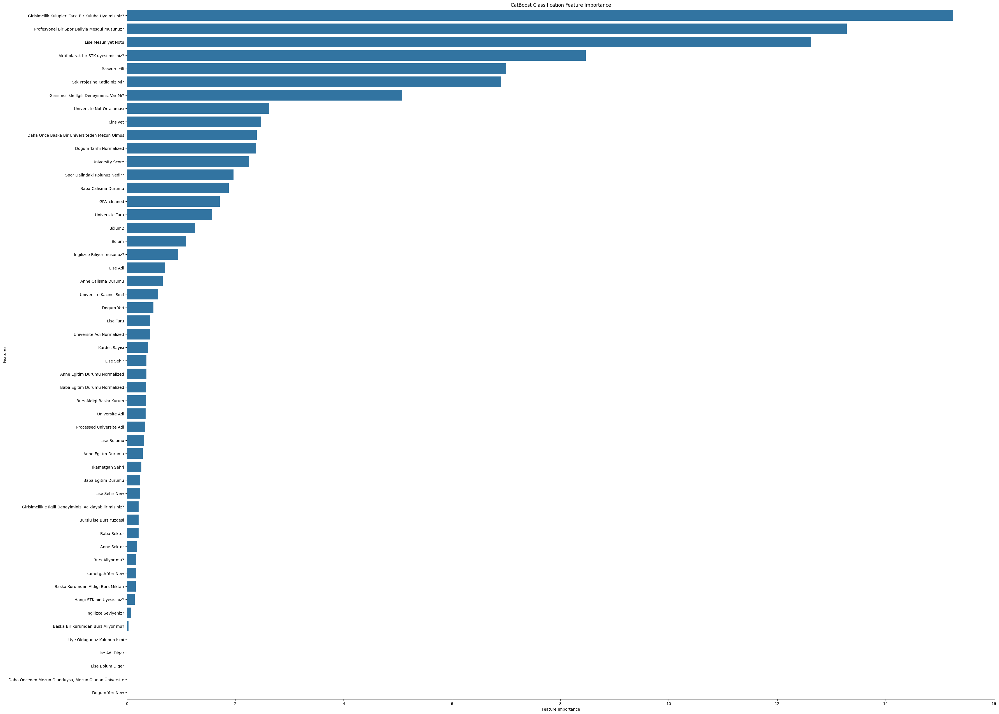

In [72]:
from matplotlib import pyplot as plt
# Function for plotting feature importance.
def plot_feature_importance(model_importance, features, model_name):

    # Create arrays of importance and features
    feature_importance = np.array(model_importance)
    feature_names = np.array(features)

    # Create  Dictionary for storing importance and names
    data={'features':feature_names,'importance':feature_importance}
    f_d = pd.DataFrame(data)

    # Sort by feature importance
    f_d.sort_values(by=['importance'], ascending=False,inplace=True)

    # Modify plot options
    plt.figure(figsize=(40,32))

    sns.barplot(x=f_d['importance'], y=f_d['features'])

    plt.title(model_name + 'Feature Importance')
    plt.xlabel('Feature Importance')
    plt.ylabel('Features')

plot_feature_importance(model.feature_importances_, X_train.columns, 'CatBoost Classification ')

In [73]:
# Create a new DataFrame for submission with the required columns
id_list = test_df['id']
submission_df = pd.DataFrame({'id': id_list, 'Degerlendirme Puani': y_pred})
submission_df.head()

,id,Degerlendirme Puani
0,0,33.060054
1,1,21.371801
2,2,5.113831
3,3,18.170238
4,4,42.460239


In [74]:
# Save the DataFrame to a CSV file for submission
submission_df.to_csv('submission2.csv', index=False)